# This is an excellent repo to a TCN implementation for tensorflow: https://github.com/philipperemy/keras-tcn

# Check the Python version being used

In [1]:
!python --version

Python 3.7.6


# Check that the available gpu is being utilized

In [2]:
import tensorflow as tf

In [3]:
print("Num GPUs Available")
print(len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available
1


# Start of second method of time series forecasting (cnn) without any normalization and with minimum bridge data

In [4]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [5]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Ensure each element in the list of lists is a float

In [6]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# View one time series

In [7]:
for i in range(22):
    print(list_of_row_components[i])

[36.0, 97.0, 428.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.3, 97.0, 955.0, 1949.0, 2.0, 11.0, 7.0]
[36.3, 96.9, 955.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 97.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 522.0, 1949.0, 2.0, 9.7, 7.3]


# Get length of list of lists

In [8]:
len(list_of_row_components)

11506

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [9]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Convert format of list to have a single time series for each index

In [10]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [11]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [12]:
list_of_examples.shape

(522, 22, 7)

# Perform train test split for dataset

In [13]:
from sklearn.model_selection import train_test_split

n_train_periods = 417
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


In [14]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (417, 21, 6)
Shape of train_y: (417,)
Shape of test_X: (105, 21, 6)
Shape of test_y: (105,)


# Build tcn model

In [15]:
from tensorflow.keras.layers import Dense
from tensorflow.keras import Input, Model

from tcn import TCN, tcn_full_summary

batch_size, timesteps, input_dim = None, 21, 6

i = Input(batch_shape=(batch_size, timesteps, input_dim))

o = TCN(return_sequences=False)(i)
o = Dense(1)(o)

tcn_model = Model(inputs=[i], outputs=[o])
tcn_model.compile(optimizer='adam', loss='mae')

tcn_full_summary(tcn_model, expand_residual_blocks=False)

history = tcn_model.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 21, 6)]           0         
_________________________________________________________________
residual_block_0 (ResidualBl [(None, 21, 64), (None, 2 9536      
_________________________________________________________________
residual_block_1 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_2 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_3 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_4 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_5 (ResidualBl [(None, 21, 64), (None, 2

Epoch 106/2000
14/14 - 0s - loss: 233.4932 - val_loss: 326.6389
Epoch 107/2000
14/14 - 0s - loss: 307.1073 - val_loss: 125.6023
Epoch 108/2000
14/14 - 0s - loss: 313.2092 - val_loss: 159.7679
Epoch 109/2000
14/14 - 0s - loss: 320.9010 - val_loss: 315.7846
Epoch 110/2000
14/14 - 0s - loss: 261.3865 - val_loss: 167.0297
Epoch 111/2000
14/14 - 0s - loss: 165.5483 - val_loss: 175.3200
Epoch 112/2000
14/14 - 0s - loss: 260.1020 - val_loss: 191.1714
Epoch 113/2000
14/14 - 0s - loss: 341.4975 - val_loss: 98.8429
Epoch 114/2000
14/14 - 0s - loss: 254.5558 - val_loss: 205.1958
Epoch 115/2000
14/14 - 0s - loss: 301.8667 - val_loss: 335.1211
Epoch 116/2000
14/14 - 0s - loss: 308.2805 - val_loss: 310.9674
Epoch 117/2000
14/14 - 0s - loss: 292.8395 - val_loss: 160.0858
Epoch 118/2000
14/14 - 0s - loss: 186.5816 - val_loss: 499.5951
Epoch 119/2000
14/14 - 0s - loss: 548.5891 - val_loss: 1231.9403
Epoch 120/2000
14/14 - 0s - loss: 397.5676 - val_loss: 226.6008
Epoch 121/2000
14/14 - 0s - loss: 181.10

Epoch 235/2000
14/14 - 0s - loss: 69.8310 - val_loss: 166.6688
Epoch 236/2000
14/14 - 0s - loss: 164.9220 - val_loss: 99.0328
Epoch 237/2000
14/14 - 0s - loss: 174.4633 - val_loss: 61.2917
Epoch 238/2000
14/14 - 0s - loss: 92.0729 - val_loss: 192.9827
Epoch 239/2000
14/14 - 0s - loss: 166.8008 - val_loss: 83.3556
Epoch 240/2000
14/14 - 0s - loss: 188.2145 - val_loss: 59.1079
Epoch 241/2000
14/14 - 0s - loss: 188.4453 - val_loss: 93.5840
Epoch 242/2000
14/14 - 0s - loss: 127.4939 - val_loss: 180.3319
Epoch 243/2000
14/14 - 0s - loss: 177.5080 - val_loss: 82.5386
Epoch 244/2000
14/14 - 0s - loss: 123.9812 - val_loss: 323.5205
Epoch 245/2000
14/14 - 0s - loss: 211.7203 - val_loss: 145.4478
Epoch 246/2000
14/14 - 0s - loss: 140.7353 - val_loss: 76.2939
Epoch 247/2000
14/14 - 0s - loss: 160.4029 - val_loss: 102.4898
Epoch 248/2000
14/14 - 0s - loss: 145.6702 - val_loss: 102.6731
Epoch 249/2000
14/14 - 0s - loss: 202.7587 - val_loss: 447.2415
Epoch 250/2000
14/14 - 0s - loss: 131.3823 - val_

Epoch 365/2000
14/14 - 0s - loss: 126.7615 - val_loss: 69.1901
Epoch 366/2000
14/14 - 0s - loss: 70.0888 - val_loss: 80.4578
Epoch 367/2000
14/14 - 0s - loss: 127.0937 - val_loss: 61.9489
Epoch 368/2000
14/14 - 0s - loss: 56.9524 - val_loss: 44.2743
Epoch 369/2000
14/14 - 0s - loss: 87.8128 - val_loss: 75.2796
Epoch 370/2000
14/14 - 0s - loss: 73.9019 - val_loss: 164.4113
Epoch 371/2000
14/14 - 0s - loss: 113.7776 - val_loss: 59.9621
Epoch 372/2000
14/14 - 0s - loss: 93.9610 - val_loss: 118.1918
Epoch 373/2000
14/14 - 0s - loss: 124.5696 - val_loss: 246.9539
Epoch 374/2000
14/14 - 0s - loss: 208.8383 - val_loss: 328.4665
Epoch 375/2000
14/14 - 0s - loss: 106.2873 - val_loss: 73.9368
Epoch 376/2000
14/14 - 0s - loss: 53.3644 - val_loss: 99.1210
Epoch 377/2000
14/14 - 0s - loss: 95.8103 - val_loss: 60.2630
Epoch 378/2000
14/14 - 0s - loss: 44.6572 - val_loss: 52.3803
Epoch 379/2000
14/14 - 0s - loss: 48.4744 - val_loss: 50.8684
Epoch 380/2000
14/14 - 0s - loss: 98.3836 - val_loss: 94.580

Epoch 496/2000
14/14 - 0s - loss: 49.4249 - val_loss: 50.0808
Epoch 497/2000
14/14 - 0s - loss: 40.0954 - val_loss: 167.8841
Epoch 498/2000
14/14 - 0s - loss: 110.6182 - val_loss: 47.9224
Epoch 499/2000
14/14 - 0s - loss: 46.4520 - val_loss: 94.5489
Epoch 500/2000
14/14 - 0s - loss: 50.3428 - val_loss: 161.4292
Epoch 501/2000
14/14 - 0s - loss: 69.8987 - val_loss: 60.8722
Epoch 502/2000
14/14 - 0s - loss: 41.3105 - val_loss: 64.7759
Epoch 503/2000
14/14 - 0s - loss: 62.5328 - val_loss: 51.0763
Epoch 504/2000
14/14 - 0s - loss: 48.3463 - val_loss: 130.9161
Epoch 505/2000
14/14 - 0s - loss: 86.0002 - val_loss: 19.9842
Epoch 506/2000
14/14 - 0s - loss: 55.8365 - val_loss: 154.7267
Epoch 507/2000
14/14 - 0s - loss: 97.7890 - val_loss: 45.9577
Epoch 508/2000
14/14 - 0s - loss: 83.0294 - val_loss: 80.5642
Epoch 509/2000
14/14 - 0s - loss: 47.6912 - val_loss: 18.3664
Epoch 510/2000
14/14 - 0s - loss: 91.2139 - val_loss: 266.4142
Epoch 511/2000
14/14 - 0s - loss: 82.2433 - val_loss: 29.5331
Ep

Epoch 628/2000
14/14 - 0s - loss: 65.8887 - val_loss: 36.7555
Epoch 629/2000
14/14 - 0s - loss: 79.5772 - val_loss: 247.3088
Epoch 630/2000
14/14 - 0s - loss: 105.9466 - val_loss: 34.5523
Epoch 631/2000
14/14 - 0s - loss: 72.8188 - val_loss: 49.3308
Epoch 632/2000
14/14 - 0s - loss: 64.1379 - val_loss: 42.5953
Epoch 633/2000
14/14 - 0s - loss: 41.8523 - val_loss: 73.7537
Epoch 634/2000
14/14 - 0s - loss: 66.3097 - val_loss: 47.7032
Epoch 635/2000
14/14 - 0s - loss: 24.9789 - val_loss: 57.4299
Epoch 636/2000
14/14 - 0s - loss: 62.4068 - val_loss: 34.5455
Epoch 637/2000
14/14 - 0s - loss: 36.6694 - val_loss: 34.2789
Epoch 638/2000
14/14 - 0s - loss: 56.9268 - val_loss: 22.5673
Epoch 639/2000
14/14 - 0s - loss: 72.7873 - val_loss: 40.7010
Epoch 640/2000
14/14 - 0s - loss: 26.9215 - val_loss: 36.9977
Epoch 641/2000
14/14 - 0s - loss: 53.9005 - val_loss: 13.6061
Epoch 642/2000
14/14 - 0s - loss: 62.0763 - val_loss: 28.8227
Epoch 643/2000
14/14 - 0s - loss: 61.3929 - val_loss: 67.0173
Epoch 

Epoch 760/2000
14/14 - 0s - loss: 47.9291 - val_loss: 9.0393
Epoch 761/2000
14/14 - 0s - loss: 61.6914 - val_loss: 31.5347
Epoch 762/2000
14/14 - 0s - loss: 21.9105 - val_loss: 43.1263
Epoch 763/2000
14/14 - 0s - loss: 74.3942 - val_loss: 160.1296
Epoch 764/2000
14/14 - 0s - loss: 48.5398 - val_loss: 31.2480
Epoch 765/2000
14/14 - 0s - loss: 44.8776 - val_loss: 14.9718
Epoch 766/2000
14/14 - 0s - loss: 16.4272 - val_loss: 34.8304
Epoch 767/2000
14/14 - 0s - loss: 18.3801 - val_loss: 87.9701
Epoch 768/2000
14/14 - 0s - loss: 54.6664 - val_loss: 24.7338
Epoch 769/2000
14/14 - 0s - loss: 42.2878 - val_loss: 26.7876
Epoch 770/2000
14/14 - 0s - loss: 30.4194 - val_loss: 47.2742
Epoch 771/2000
14/14 - 0s - loss: 55.1554 - val_loss: 26.5108
Epoch 772/2000
14/14 - 0s - loss: 43.5343 - val_loss: 24.0551
Epoch 773/2000
14/14 - 0s - loss: 51.8388 - val_loss: 21.1483
Epoch 774/2000
14/14 - 0s - loss: 45.4402 - val_loss: 17.4881
Epoch 775/2000
14/14 - 0s - loss: 32.3140 - val_loss: 45.8149
Epoch 77

Epoch 892/2000
14/14 - 0s - loss: 28.9476 - val_loss: 92.9584
Epoch 893/2000
14/14 - 0s - loss: 43.3360 - val_loss: 80.0653
Epoch 894/2000
14/14 - 0s - loss: 95.4184 - val_loss: 147.7147
Epoch 895/2000
14/14 - 0s - loss: 80.5915 - val_loss: 66.5679
Epoch 896/2000
14/14 - 0s - loss: 43.6479 - val_loss: 20.3863
Epoch 897/2000
14/14 - 0s - loss: 46.4352 - val_loss: 20.9110
Epoch 898/2000
14/14 - 0s - loss: 25.0925 - val_loss: 33.2763
Epoch 899/2000
14/14 - 0s - loss: 26.8377 - val_loss: 78.7534
Epoch 900/2000
14/14 - 0s - loss: 53.7401 - val_loss: 18.3232
Epoch 901/2000
14/14 - 0s - loss: 52.9732 - val_loss: 32.2513
Epoch 902/2000
14/14 - 0s - loss: 45.3275 - val_loss: 13.1449
Epoch 903/2000
14/14 - 0s - loss: 41.8446 - val_loss: 28.4624
Epoch 904/2000
14/14 - 0s - loss: 42.5206 - val_loss: 25.7244
Epoch 905/2000
14/14 - 0s - loss: 55.6225 - val_loss: 163.8990
Epoch 906/2000
14/14 - 0s - loss: 65.3562 - val_loss: 25.4276
Epoch 907/2000
14/14 - 0s - loss: 46.6424 - val_loss: 16.6100
Epoch 

Epoch 1024/2000
14/14 - 0s - loss: 58.7414 - val_loss: 111.0314
Epoch 1025/2000
14/14 - 0s - loss: 52.2110 - val_loss: 20.6696
Epoch 1026/2000
14/14 - 0s - loss: 43.8073 - val_loss: 17.4998
Epoch 1027/2000
14/14 - 0s - loss: 42.0193 - val_loss: 16.6854
Epoch 1028/2000
14/14 - 0s - loss: 21.8904 - val_loss: 67.4493
Epoch 1029/2000
14/14 - 0s - loss: 45.4182 - val_loss: 19.7801
Epoch 1030/2000
14/14 - 0s - loss: 25.4904 - val_loss: 37.7592
Epoch 1031/2000
14/14 - 0s - loss: 48.0784 - val_loss: 136.4915
Epoch 1032/2000
14/14 - 0s - loss: 56.8504 - val_loss: 25.2549
Epoch 1033/2000
14/14 - 0s - loss: 51.8217 - val_loss: 22.4488
Epoch 1034/2000
14/14 - 0s - loss: 44.2270 - val_loss: 12.4062
Epoch 1035/2000
14/14 - 0s - loss: 22.6239 - val_loss: 40.9045
Epoch 1036/2000
14/14 - 0s - loss: 55.7120 - val_loss: 114.4260
Epoch 1037/2000
14/14 - 0s - loss: 51.7614 - val_loss: 26.0710
Epoch 1038/2000
14/14 - 0s - loss: 44.9709 - val_loss: 12.5601
Epoch 1039/2000
14/14 - 0s - loss: 41.5262 - val_los

14/14 - 0s - loss: 36.6164 - val_loss: 10.1695
Epoch 1155/2000
14/14 - 0s - loss: 18.6456 - val_loss: 8.6374
Epoch 1156/2000
14/14 - 0s - loss: 11.9183 - val_loss: 26.7605
Epoch 1157/2000
14/14 - 0s - loss: 17.8033 - val_loss: 34.5913
Epoch 1158/2000
14/14 - 0s - loss: 18.1175 - val_loss: 16.1941
Epoch 1159/2000
14/14 - 0s - loss: 28.5328 - val_loss: 15.0999
Epoch 1160/2000
14/14 - 0s - loss: 36.9291 - val_loss: 19.4565
Epoch 1161/2000
14/14 - 0s - loss: 34.5840 - val_loss: 34.6412
Epoch 1162/2000
14/14 - 0s - loss: 28.5357 - val_loss: 65.9674
Epoch 1163/2000
14/14 - 0s - loss: 42.8173 - val_loss: 24.8108
Epoch 1164/2000
14/14 - 0s - loss: 38.9272 - val_loss: 20.2850
Epoch 1165/2000
14/14 - 0s - loss: 36.5189 - val_loss: 9.1992
Epoch 1166/2000
14/14 - 0s - loss: 32.2389 - val_loss: 14.6926
Epoch 1167/2000
14/14 - 0s - loss: 33.2660 - val_loss: 17.5349
Epoch 1168/2000
14/14 - 0s - loss: 30.6914 - val_loss: 9.6408
Epoch 1169/2000
14/14 - 0s - loss: 13.0176 - val_loss: 8.3017
Epoch 1170/2

Epoch 1285/2000
14/14 - 0s - loss: 34.3405 - val_loss: 69.0831
Epoch 1286/2000
14/14 - 0s - loss: 48.1424 - val_loss: 103.2198
Epoch 1287/2000
14/14 - 0s - loss: 32.1169 - val_loss: 38.4866
Epoch 1288/2000
14/14 - 0s - loss: 25.7981 - val_loss: 9.7408
Epoch 1289/2000
14/14 - 0s - loss: 13.4559 - val_loss: 25.8636
Epoch 1290/2000
14/14 - 0s - loss: 24.6730 - val_loss: 19.9109
Epoch 1291/2000
14/14 - 0s - loss: 29.9166 - val_loss: 30.8113
Epoch 1292/2000
14/14 - 0s - loss: 17.5993 - val_loss: 57.6115
Epoch 1293/2000
14/14 - 0s - loss: 26.3410 - val_loss: 33.1120
Epoch 1294/2000
14/14 - 0s - loss: 33.7945 - val_loss: 7.4916
Epoch 1295/2000
14/14 - 0s - loss: 29.8024 - val_loss: 8.0844
Epoch 1296/2000
14/14 - 0s - loss: 12.6111 - val_loss: 16.4715
Epoch 1297/2000
14/14 - 0s - loss: 14.7407 - val_loss: 15.3490
Epoch 1298/2000
14/14 - 0s - loss: 29.6646 - val_loss: 8.9723
Epoch 1299/2000
14/14 - 0s - loss: 35.9602 - val_loss: 14.0402
Epoch 1300/2000
14/14 - 0s - loss: 27.3670 - val_loss: 6.9

Epoch 1416/2000
14/14 - 0s - loss: 30.5796 - val_loss: 12.6170
Epoch 1417/2000
14/14 - 0s - loss: 31.5348 - val_loss: 17.2254
Epoch 1418/2000
14/14 - 0s - loss: 12.9479 - val_loss: 9.1952
Epoch 1419/2000
14/14 - 0s - loss: 22.5150 - val_loss: 20.8674
Epoch 1420/2000
14/14 - 0s - loss: 34.7085 - val_loss: 5.6743
Epoch 1421/2000
14/14 - 0s - loss: 24.2292 - val_loss: 9.6768
Epoch 1422/2000
14/14 - 0s - loss: 26.1015 - val_loss: 18.5609
Epoch 1423/2000
14/14 - 0s - loss: 24.5506 - val_loss: 36.2718
Epoch 1424/2000
14/14 - 0s - loss: 22.5248 - val_loss: 60.6746
Epoch 1425/2000
14/14 - 0s - loss: 35.6736 - val_loss: 22.0622
Epoch 1426/2000
14/14 - 0s - loss: 17.8720 - val_loss: 42.9721
Epoch 1427/2000
14/14 - 0s - loss: 42.8487 - val_loss: 73.4305
Epoch 1428/2000
14/14 - 0s - loss: 27.1307 - val_loss: 53.1934
Epoch 1429/2000
14/14 - 0s - loss: 58.4633 - val_loss: 121.3896
Epoch 1430/2000
14/14 - 0s - loss: 42.3304 - val_loss: 42.8253
Epoch 1431/2000
14/14 - 0s - loss: 32.1554 - val_loss: 13

Epoch 1547/2000
14/14 - 0s - loss: 22.8284 - val_loss: 6.0597
Epoch 1548/2000
14/14 - 0s - loss: 9.6437 - val_loss: 18.3315
Epoch 1549/2000
14/14 - 0s - loss: 14.4402 - val_loss: 15.4492
Epoch 1550/2000
14/14 - 0s - loss: 10.7557 - val_loss: 12.6701
Epoch 1551/2000
14/14 - 0s - loss: 14.9679 - val_loss: 27.9110
Epoch 1552/2000
14/14 - 0s - loss: 14.4077 - val_loss: 39.5090
Epoch 1553/2000
14/14 - 0s - loss: 31.1205 - val_loss: 7.4541
Epoch 1554/2000
14/14 - 0s - loss: 24.4698 - val_loss: 6.8313
Epoch 1555/2000
14/14 - 0s - loss: 12.4832 - val_loss: 8.4284
Epoch 1556/2000
14/14 - 0s - loss: 20.8336 - val_loss: 14.6384
Epoch 1557/2000
14/14 - 0s - loss: 24.8289 - val_loss: 10.4734
Epoch 1558/2000
14/14 - 0s - loss: 23.9721 - val_loss: 8.5068
Epoch 1559/2000
14/14 - 0s - loss: 24.0606 - val_loss: 27.6374
Epoch 1560/2000
14/14 - 0s - loss: 26.0619 - val_loss: 19.2143
Epoch 1561/2000
14/14 - 0s - loss: 37.3123 - val_loss: 76.4322
Epoch 1562/2000
14/14 - 0s - loss: 36.4400 - val_loss: 11.159

Epoch 1678/2000
14/14 - 0s - loss: 158.3753 - val_loss: 6.7314
Epoch 1679/2000
14/14 - 0s - loss: 176.5427 - val_loss: 23.6667
Epoch 1680/2000
14/14 - 0s - loss: 167.4013 - val_loss: 28.0435
Epoch 1681/2000
14/14 - 0s - loss: 168.4961 - val_loss: 19.0613
Epoch 1682/2000
14/14 - 0s - loss: 163.9003 - val_loss: 20.0267
Epoch 1683/2000
14/14 - 0s - loss: 169.3369 - val_loss: 26.4241
Epoch 1684/2000
14/14 - 0s - loss: 159.6626 - val_loss: 18.4160
Epoch 1685/2000
14/14 - 0s - loss: 168.4766 - val_loss: 26.4444
Epoch 1686/2000
14/14 - 0s - loss: 159.3012 - val_loss: 24.4061
Epoch 1687/2000
14/14 - 0s - loss: 159.6213 - val_loss: 8.6678
Epoch 1688/2000
14/14 - 0s - loss: 171.2381 - val_loss: 33.3290
Epoch 1689/2000
14/14 - 0s - loss: 158.4567 - val_loss: 16.9879
Epoch 1690/2000
14/14 - 0s - loss: 162.5529 - val_loss: 25.7558
Epoch 1691/2000
14/14 - 0s - loss: 159.8037 - val_loss: 18.1218
Epoch 1692/2000
14/14 - 0s - loss: 161.0287 - val_loss: 25.4384
Epoch 1693/2000
14/14 - 0s - loss: 159.240

14/14 - 0s - loss: 28.1315 - val_loss: 84.2248
Epoch 1809/2000
14/14 - 0s - loss: 36.3118 - val_loss: 18.4697
Epoch 1810/2000
14/14 - 0s - loss: 23.0289 - val_loss: 10.9568
Epoch 1811/2000
14/14 - 0s - loss: 24.5138 - val_loss: 19.3518
Epoch 1812/2000
14/14 - 0s - loss: 21.8955 - val_loss: 11.0500
Epoch 1813/2000
14/14 - 0s - loss: 23.6296 - val_loss: 5.2790
Epoch 1814/2000
14/14 - 0s - loss: 20.8199 - val_loss: 12.1425
Epoch 1815/2000
14/14 - 0s - loss: 21.7190 - val_loss: 12.1724
Epoch 1816/2000
14/14 - 0s - loss: 19.6693 - val_loss: 14.9575
Epoch 1817/2000
14/14 - 0s - loss: 19.1672 - val_loss: 5.9608
Epoch 1818/2000
14/14 - 0s - loss: 8.2001 - val_loss: 12.3560
Epoch 1819/2000
14/14 - 0s - loss: 8.5694 - val_loss: 22.1855
Epoch 1820/2000
14/14 - 0s - loss: 20.3876 - val_loss: 4.1756
Epoch 1821/2000
14/14 - 0s - loss: 7.8342 - val_loss: 39.1848
Epoch 1822/2000
14/14 - 0s - loss: 19.8998 - val_loss: 37.0264
Epoch 1823/2000
14/14 - 0s - loss: 24.3217 - val_loss: 7.0527
Epoch 1824/2000

14/14 - 0s - loss: 204.5885 - val_loss: 54.8468
Epoch 1940/2000
14/14 - 0s - loss: 144.6831 - val_loss: 13.6363
Epoch 1941/2000
14/14 - 0s - loss: 161.5171 - val_loss: 44.2551
Epoch 1942/2000
14/14 - 0s - loss: 134.7342 - val_loss: 3.8796
Epoch 1943/2000
14/14 - 0s - loss: 146.5820 - val_loss: 15.0657
Epoch 1944/2000
14/14 - 0s - loss: 162.1299 - val_loss: 18.2939
Epoch 1945/2000
14/14 - 0s - loss: 160.3524 - val_loss: 36.9404
Epoch 1946/2000
14/14 - 0s - loss: 141.8596 - val_loss: 5.6107
Epoch 1947/2000
14/14 - 0s - loss: 154.6902 - val_loss: 19.4127
Epoch 1948/2000
14/14 - 0s - loss: 154.3354 - val_loss: 20.7199
Epoch 1949/2000
14/14 - 0s - loss: 153.5266 - val_loss: 24.2334
Epoch 1950/2000
14/14 - 0s - loss: 151.0403 - val_loss: 18.1626
Epoch 1951/2000
14/14 - 0s - loss: 152.5824 - val_loss: 22.9834
Epoch 1952/2000
14/14 - 0s - loss: 147.4509 - val_loss: 12.6186
Epoch 1953/2000
14/14 - 0s - loss: 156.3617 - val_loss: 28.4349
Epoch 1954/2000
14/14 - 0s - loss: 146.9561 - val_loss: 14

# Plot model loss and validation loss

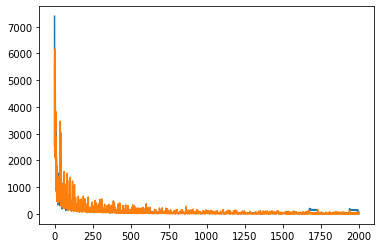

In [16]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [17]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = tcn_model.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [18]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 32.68878553537477


# Make predictions based on test set and get a root mean squared error 

In [19]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = tcn_model.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [20]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 33.68656657618764


# Plot train labels along with train predictions

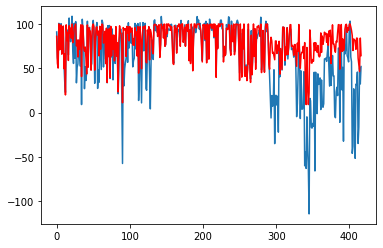

In [21]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

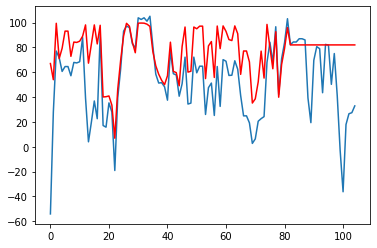

In [22]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with normalization of features

In [23]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [24]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Ensure each element in the list of lists is a float

In [25]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# View one time series

In [26]:
for i in range(22):
    print(list_of_row_components[i])

[36.0, 97.0, 428.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.0, 96.9, 955.0, 1949.0, 2.0, 10.9, 7.3]
[36.3, 97.0, 955.0, 1949.0, 2.0, 11.0, 7.0]
[36.3, 96.9, 955.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 96.9, 983.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 11.0, 7.3]
[36.3, 97.0, 422.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 97.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 369.0, 1949.0, 2.0, 9.7, 7.3]
[36.3, 86.0, 522.0, 1949.0, 2.0, 9.7, 7.3]


# Get length of list of lists

In [27]:
len(list_of_row_components)

11506

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [28]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Convert format of list to have a single time series for each index

In [29]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [30]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [31]:
list_of_examples.shape

(522, 22, 7)

# Perform train test split for dataset

In [32]:
from sklearn.model_selection import train_test_split

n_train_periods = 417
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


# Apply MinMaxScaler on data

In [33]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

for idx, x in enumerate(train_X):
    train_X[idx] = scaler.fit_transform(x)

train_y = scaler.fit_transform(train_y.reshape(-1,1))

for idx, x in enumerate(test_X):
    test_X[idx] = scaler.fit_transform(x)

test_y = scaler.fit_transform(test_y.reshape(-1,1))

In [34]:
train_y = train_y.reshape(417,)
test_y = test_y.reshape(105,)

In [35]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (417, 21, 6)
Shape of train_y: (417,)
Shape of test_X: (105, 21, 6)
Shape of test_y: (105,)


# Build tcn model

In [36]:
from tensorflow.keras.layers import Dense
from tensorflow.keras import Input, Model

from tcn import TCN, tcn_full_summary

batch_size, timesteps, input_dim = None, 21, 6

i = Input(batch_shape=(batch_size, timesteps, input_dim))

o = TCN(return_sequences=False)(i)
o = Dense(1)(o)

tcn_norm = Model(inputs=[i], outputs=[o])
tcn_norm.compile(optimizer='adam', loss='mae')

tcn_full_summary(tcn_norm, expand_residual_blocks=False)

history = tcn_norm.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Model: "functional_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 21, 6)]           0         
_________________________________________________________________
residual_block_0 (ResidualBl [(None, 21, 64), (None, 2 9536      
_________________________________________________________________
residual_block_1 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_2 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_3 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_4 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_5 (ResidualBl [(None, 21, 64), (None, 2

Epoch 114/2000
14/14 - 0s - loss: 0.1003 - val_loss: 0.2157
Epoch 115/2000
14/14 - 0s - loss: 0.1356 - val_loss: 0.1708
Epoch 116/2000
14/14 - 0s - loss: 0.0892 - val_loss: 0.1547
Epoch 117/2000
14/14 - 0s - loss: 0.0906 - val_loss: 0.1573
Epoch 118/2000
14/14 - 0s - loss: 0.0634 - val_loss: 0.1721
Epoch 119/2000
14/14 - 0s - loss: 0.0687 - val_loss: 0.2130
Epoch 120/2000
14/14 - 0s - loss: 0.1224 - val_loss: 0.1604
Epoch 121/2000
14/14 - 0s - loss: 0.0995 - val_loss: 0.1698
Epoch 122/2000
14/14 - 0s - loss: 0.0916 - val_loss: 0.1593
Epoch 123/2000
14/14 - 0s - loss: 0.0701 - val_loss: 0.1939
Epoch 124/2000
14/14 - 0s - loss: 0.0950 - val_loss: 0.1890
Epoch 125/2000
14/14 - 0s - loss: 0.0986 - val_loss: 0.1643
Epoch 126/2000
14/14 - 0s - loss: 0.0912 - val_loss: 0.1612
Epoch 127/2000
14/14 - 0s - loss: 0.0894 - val_loss: 0.1694
Epoch 128/2000
14/14 - 0s - loss: 0.0891 - val_loss: 0.2051
Epoch 129/2000
14/14 - 0s - loss: 0.1274 - val_loss: 0.1587
Epoch 130/2000
14/14 - 0s - loss: 0.0888

Epoch 251/2000
14/14 - 0s - loss: 0.0558 - val_loss: 0.1503
Epoch 252/2000
14/14 - 0s - loss: 0.0507 - val_loss: 0.1535
Epoch 253/2000
14/14 - 0s - loss: 0.0729 - val_loss: 0.1645
Epoch 254/2000
14/14 - 0s - loss: 0.0754 - val_loss: 0.1635
Epoch 255/2000
14/14 - 0s - loss: 0.0721 - val_loss: 0.1497
Epoch 256/2000
14/14 - 0s - loss: 0.0517 - val_loss: 0.1517
Epoch 257/2000
14/14 - 0s - loss: 0.0705 - val_loss: 0.1632
Epoch 258/2000
14/14 - 0s - loss: 0.0592 - val_loss: 0.1721
Epoch 259/2000
14/14 - 0s - loss: 0.0816 - val_loss: 0.1454
Epoch 260/2000
14/14 - 0s - loss: 0.0528 - val_loss: 0.1535
Epoch 261/2000
14/14 - 0s - loss: 0.0720 - val_loss: 0.1722
Epoch 262/2000
14/14 - 0s - loss: 0.0701 - val_loss: 0.1663
Epoch 263/2000
14/14 - 0s - loss: 0.0746 - val_loss: 0.1479
Epoch 264/2000
14/14 - 0s - loss: 0.0528 - val_loss: 0.1538
Epoch 265/2000
14/14 - 0s - loss: 0.0730 - val_loss: 0.1633
Epoch 266/2000
14/14 - 0s - loss: 0.0728 - val_loss: 0.1633
Epoch 267/2000
14/14 - 0s - loss: 0.0713

Epoch 388/2000
14/14 - 0s - loss: 0.0526 - val_loss: 0.1515
Epoch 389/2000
14/14 - 0s - loss: 0.0461 - val_loss: 0.1474
Epoch 390/2000
14/14 - 0s - loss: 0.0367 - val_loss: 0.1483
Epoch 391/2000
14/14 - 0s - loss: 0.0581 - val_loss: 0.1491
Epoch 392/2000
14/14 - 0s - loss: 0.0506 - val_loss: 0.1629
Epoch 393/2000
14/14 - 0s - loss: 0.0716 - val_loss: 0.1442
Epoch 394/2000
14/14 - 0s - loss: 0.0463 - val_loss: 0.1437
Epoch 395/2000
14/14 - 0s - loss: 0.0590 - val_loss: 0.1546
Epoch 396/2000
14/14 - 0s - loss: 0.0524 - val_loss: 0.1554
Epoch 397/2000
14/14 - 0s - loss: 0.0593 - val_loss: 0.1430
Epoch 398/2000
14/14 - 0s - loss: 0.0449 - val_loss: 0.1482
Epoch 399/2000
14/14 - 0s - loss: 0.0585 - val_loss: 0.1571
Epoch 400/2000
14/14 - 0s - loss: 0.0607 - val_loss: 0.1547
Epoch 401/2000
14/14 - 0s - loss: 0.0570 - val_loss: 0.1425
Epoch 402/2000
14/14 - 0s - loss: 0.0403 - val_loss: 0.1468
Epoch 403/2000
14/14 - 0s - loss: 0.0597 - val_loss: 0.1592
Epoch 404/2000
14/14 - 0s - loss: 0.0581

Epoch 525/2000
14/14 - 0s - loss: 0.0560 - val_loss: 0.1481
Epoch 526/2000
14/14 - 0s - loss: 0.0409 - val_loss: 0.1462
Epoch 527/2000
14/14 - 0s - loss: 0.0552 - val_loss: 0.1563
Epoch 528/2000
14/14 - 0s - loss: 0.0553 - val_loss: 0.1473
Epoch 529/2000
14/14 - 0s - loss: 0.0449 - val_loss: 0.1451
Epoch 530/2000
14/14 - 0s - loss: 0.0388 - val_loss: 0.1486
Epoch 531/2000
14/14 - 0s - loss: 0.0524 - val_loss: 0.1613
Epoch 532/2000
14/14 - 0s - loss: 0.0593 - val_loss: 0.1474
Epoch 533/2000
14/14 - 0s - loss: 0.0404 - val_loss: 0.1464
Epoch 534/2000
14/14 - 0s - loss: 0.0381 - val_loss: 0.1521
Epoch 535/2000
14/14 - 0s - loss: 0.0371 - val_loss: 0.1552
Epoch 536/2000
14/14 - 0s - loss: 0.0460 - val_loss: 0.1477
Epoch 537/2000
14/14 - 0s - loss: 0.0442 - val_loss: 0.1463
Epoch 538/2000
14/14 - 0s - loss: 0.0483 - val_loss: 0.1455
Epoch 539/2000
14/14 - 0s - loss: 0.0487 - val_loss: 0.1558
Epoch 540/2000
14/14 - 0s - loss: 0.0602 - val_loss: 0.1469
Epoch 541/2000
14/14 - 0s - loss: 0.0416

Epoch 662/2000
14/14 - 0s - loss: 0.0483 - val_loss: 0.1508
Epoch 663/2000
14/14 - 0s - loss: 0.0412 - val_loss: 0.1539
Epoch 664/2000
14/14 - 0s - loss: 0.0442 - val_loss: 0.1421
Epoch 665/2000
14/14 - 0s - loss: 0.0430 - val_loss: 0.1421
Epoch 666/2000
14/14 - 0s - loss: 0.0484 - val_loss: 0.1517
Epoch 667/2000
14/14 - 0s - loss: 0.0414 - val_loss: 0.1504
Epoch 668/2000
14/14 - 0s - loss: 0.0389 - val_loss: 0.1460
Epoch 669/2000
14/14 - 0s - loss: 0.0363 - val_loss: 0.1418
Epoch 670/2000
14/14 - 0s - loss: 0.0501 - val_loss: 0.1505
Epoch 671/2000
14/14 - 0s - loss: 0.0437 - val_loss: 0.1509
Epoch 672/2000
14/14 - 0s - loss: 0.0413 - val_loss: 0.1444
Epoch 673/2000
14/14 - 0s - loss: 0.0366 - val_loss: 0.1434
Epoch 674/2000
14/14 - 0s - loss: 0.0512 - val_loss: 0.1535
Epoch 675/2000
14/14 - 0s - loss: 0.0438 - val_loss: 0.1512
Epoch 676/2000
14/14 - 0s - loss: 0.0407 - val_loss: 0.1447
Epoch 677/2000
14/14 - 0s - loss: 0.0365 - val_loss: 0.1421
Epoch 678/2000
14/14 - 0s - loss: 0.0484

Epoch 799/2000
14/14 - 0s - loss: 0.0374 - val_loss: 0.1355
Epoch 800/2000
14/14 - 0s - loss: 0.0453 - val_loss: 0.1475
Epoch 801/2000
14/14 - 0s - loss: 0.0401 - val_loss: 0.1454
Epoch 802/2000
14/14 - 0s - loss: 0.0399 - val_loss: 0.1417
Epoch 803/2000
14/14 - 0s - loss: 0.0359 - val_loss: 0.1404
Epoch 804/2000
14/14 - 0s - loss: 0.0374 - val_loss: 0.1450
Epoch 805/2000
14/14 - 0s - loss: 0.0405 - val_loss: 0.1451
Epoch 806/2000
14/14 - 0s - loss: 0.0385 - val_loss: 0.1416
Epoch 807/2000
14/14 - 0s - loss: 0.0367 - val_loss: 0.1389
Epoch 808/2000
14/14 - 0s - loss: 0.0399 - val_loss: 0.1455
Epoch 809/2000
14/14 - 0s - loss: 0.0410 - val_loss: 0.1458
Epoch 810/2000
14/14 - 0s - loss: 0.0374 - val_loss: 0.1424
Epoch 811/2000
14/14 - 0s - loss: 0.0354 - val_loss: 0.1378
Epoch 812/2000
14/14 - 0s - loss: 0.0412 - val_loss: 0.1474
Epoch 813/2000
14/14 - 0s - loss: 0.0418 - val_loss: 0.1474
Epoch 814/2000
14/14 - 0s - loss: 0.0371 - val_loss: 0.1437
Epoch 815/2000
14/14 - 0s - loss: 0.0354

Epoch 936/2000
14/14 - 0s - loss: 0.0378 - val_loss: 0.1420
Epoch 937/2000
14/14 - 0s - loss: 0.0364 - val_loss: 0.1423
Epoch 938/2000
14/14 - 0s - loss: 0.0363 - val_loss: 0.1406
Epoch 939/2000
14/14 - 0s - loss: 0.0340 - val_loss: 0.1358
Epoch 940/2000
14/14 - 0s - loss: 0.0379 - val_loss: 0.1409
Epoch 941/2000
14/14 - 0s - loss: 0.0327 - val_loss: 0.1415
Epoch 942/2000
14/14 - 0s - loss: 0.0349 - val_loss: 0.1393
Epoch 943/2000
14/14 - 0s - loss: 0.0307 - val_loss: 0.1373
Epoch 944/2000
14/14 - 0s - loss: 0.0419 - val_loss: 0.1417
Epoch 945/2000
14/14 - 0s - loss: 0.0349 - val_loss: 0.1389
Epoch 946/2000
14/14 - 0s - loss: 0.0348 - val_loss: 0.1379
Epoch 947/2000
14/14 - 0s - loss: 0.0305 - val_loss: 0.1351
Epoch 948/2000
14/14 - 0s - loss: 0.0429 - val_loss: 0.1452
Epoch 949/2000
14/14 - 0s - loss: 0.0334 - val_loss: 0.1439
Epoch 950/2000
14/14 - 0s - loss: 0.0315 - val_loss: 0.1392
Epoch 951/2000
14/14 - 0s - loss: 0.0318 - val_loss: 0.1349
Epoch 952/2000
14/14 - 0s - loss: 0.0437

Epoch 1072/2000
14/14 - 0s - loss: 0.0322 - val_loss: 0.1369
Epoch 1073/2000
14/14 - 0s - loss: 0.0336 - val_loss: 0.1428
Epoch 1074/2000
14/14 - 0s - loss: 0.0390 - val_loss: 0.1404
Epoch 1075/2000
14/14 - 0s - loss: 0.0327 - val_loss: 0.1379
Epoch 1076/2000
14/14 - 0s - loss: 0.0318 - val_loss: 0.1380
Epoch 1077/2000
14/14 - 0s - loss: 0.0351 - val_loss: 0.1412
Epoch 1078/2000
14/14 - 0s - loss: 0.0376 - val_loss: 0.1380
Epoch 1079/2000
14/14 - 0s - loss: 0.0302 - val_loss: 0.1348
Epoch 1080/2000
14/14 - 0s - loss: 0.0294 - val_loss: 0.1360
Epoch 1081/2000
14/14 - 0s - loss: 0.0368 - val_loss: 0.1409
Epoch 1082/2000
14/14 - 0s - loss: 0.0371 - val_loss: 0.1384
Epoch 1083/2000
14/14 - 0s - loss: 0.0330 - val_loss: 0.1363
Epoch 1084/2000
14/14 - 0s - loss: 0.0317 - val_loss: 0.1350
Epoch 1085/2000
14/14 - 0s - loss: 0.0383 - val_loss: 0.1416
Epoch 1086/2000
14/14 - 0s - loss: 0.0334 - val_loss: 0.1429
Epoch 1087/2000
14/14 - 0s - loss: 0.0344 - val_loss: 0.1376
Epoch 1088/2000
14/14 - 

Epoch 1207/2000
14/14 - 0s - loss: 0.0350 - val_loss: 0.1389
Epoch 1208/2000
14/14 - 0s - loss: 0.0316 - val_loss: 0.1360
Epoch 1209/2000
14/14 - 0s - loss: 0.0290 - val_loss: 0.1364
Epoch 1210/2000
14/14 - 0s - loss: 0.0354 - val_loss: 0.1420
Epoch 1211/2000
14/14 - 0s - loss: 0.0314 - val_loss: 0.1425
Epoch 1212/2000
14/14 - 0s - loss: 0.0326 - val_loss: 0.1392
Epoch 1213/2000
14/14 - 0s - loss: 0.0284 - val_loss: 0.1363
Epoch 1214/2000
14/14 - 0s - loss: 0.0385 - val_loss: 0.1431
Epoch 1215/2000
14/14 - 0s - loss: 0.0325 - val_loss: 0.1410
Epoch 1216/2000
14/14 - 0s - loss: 0.0281 - val_loss: 0.1368
Epoch 1217/2000
14/14 - 0s - loss: 0.0265 - val_loss: 0.1349
Epoch 1218/2000
14/14 - 0s - loss: 0.0346 - val_loss: 0.1419
Epoch 1219/2000
14/14 - 0s - loss: 0.0325 - val_loss: 0.1428
Epoch 1220/2000
14/14 - 0s - loss: 0.0332 - val_loss: 0.1384
Epoch 1221/2000
14/14 - 0s - loss: 0.0331 - val_loss: 0.1360
Epoch 1222/2000
14/14 - 0s - loss: 0.0358 - val_loss: 0.1388
Epoch 1223/2000
14/14 - 

Epoch 1342/2000
14/14 - 0s - loss: 0.0298 - val_loss: 0.1373
Epoch 1343/2000
14/14 - 0s - loss: 0.0307 - val_loss: 0.1364
Epoch 1344/2000
14/14 - 0s - loss: 0.0316 - val_loss: 0.1421
Epoch 1345/2000
14/14 - 0s - loss: 0.0329 - val_loss: 0.1419
Epoch 1346/2000
14/14 - 0s - loss: 0.0313 - val_loss: 0.1372
Epoch 1347/2000
14/14 - 0s - loss: 0.0295 - val_loss: 0.1352
Epoch 1348/2000
14/14 - 0s - loss: 0.0342 - val_loss: 0.1396
Epoch 1349/2000
14/14 - 0s - loss: 0.0325 - val_loss: 0.1401
Epoch 1350/2000
14/14 - 0s - loss: 0.0305 - val_loss: 0.1370
Epoch 1351/2000
14/14 - 0s - loss: 0.0316 - val_loss: 0.1364
Epoch 1352/2000
14/14 - 0s - loss: 0.0322 - val_loss: 0.1399
Epoch 1353/2000
14/14 - 0s - loss: 0.0306 - val_loss: 0.1413
Epoch 1354/2000
14/14 - 0s - loss: 0.0335 - val_loss: 0.1360
Epoch 1355/2000
14/14 - 0s - loss: 0.0297 - val_loss: 0.1320
Epoch 1356/2000
14/14 - 0s - loss: 0.0332 - val_loss: 0.1365
Epoch 1357/2000
14/14 - 0s - loss: 0.0327 - val_loss: 0.1393
Epoch 1358/2000
14/14 - 

Epoch 1477/2000
14/14 - 0s - loss: 0.0316 - val_loss: 0.1385
Epoch 1478/2000
14/14 - 0s - loss: 0.0291 - val_loss: 0.1415
Epoch 1479/2000
14/14 - 0s - loss: 0.0325 - val_loss: 0.1387
Epoch 1480/2000
14/14 - 0s - loss: 0.0280 - val_loss: 0.1379
Epoch 1481/2000
14/14 - 0s - loss: 0.0301 - val_loss: 0.1414
Epoch 1482/2000
14/14 - 0s - loss: 0.0287 - val_loss: 0.1433
Epoch 1483/2000
14/14 - 0s - loss: 0.0336 - val_loss: 0.1421
Epoch 1484/2000
14/14 - 0s - loss: 0.0289 - val_loss: 0.1409
Epoch 1485/2000
14/14 - 0s - loss: 0.0303 - val_loss: 0.1425
Epoch 1486/2000
14/14 - 0s - loss: 0.0278 - val_loss: 0.1422
Epoch 1487/2000
14/14 - 0s - loss: 0.0309 - val_loss: 0.1379
Epoch 1488/2000
14/14 - 0s - loss: 0.0278 - val_loss: 0.1386
Epoch 1489/2000
14/14 - 0s - loss: 0.0317 - val_loss: 0.1408
Epoch 1490/2000
14/14 - 0s - loss: 0.0281 - val_loss: 0.1427
Epoch 1491/2000
14/14 - 0s - loss: 0.0327 - val_loss: 0.1393
Epoch 1492/2000
14/14 - 0s - loss: 0.0275 - val_loss: 0.1393
Epoch 1493/2000
14/14 - 

Epoch 1612/2000
14/14 - 0s - loss: 0.0255 - val_loss: 0.1416
Epoch 1613/2000
14/14 - 0s - loss: 0.0261 - val_loss: 0.1378
Epoch 1614/2000
14/14 - 0s - loss: 0.0321 - val_loss: 0.1421
Epoch 1615/2000
14/14 - 0s - loss: 0.0284 - val_loss: 0.1449
Epoch 1616/2000
14/14 - 0s - loss: 0.0290 - val_loss: 0.1415
Epoch 1617/2000
14/14 - 0s - loss: 0.0284 - val_loss: 0.1405
Epoch 1618/2000
14/14 - 0s - loss: 0.0314 - val_loss: 0.1459
Epoch 1619/2000
14/14 - 0s - loss: 0.0274 - val_loss: 0.1462
Epoch 1620/2000
14/14 - 0s - loss: 0.0299 - val_loss: 0.1426
Epoch 1621/2000
14/14 - 0s - loss: 0.0279 - val_loss: 0.1401
Epoch 1622/2000
14/14 - 0s - loss: 0.0328 - val_loss: 0.1443
Epoch 1623/2000
14/14 - 0s - loss: 0.0270 - val_loss: 0.1440
Epoch 1624/2000
14/14 - 0s - loss: 0.0297 - val_loss: 0.1417
Epoch 1625/2000
14/14 - 0s - loss: 0.0275 - val_loss: 0.1405
Epoch 1626/2000
14/14 - 0s - loss: 0.0315 - val_loss: 0.1449
Epoch 1627/2000
14/14 - 0s - loss: 0.0290 - val_loss: 0.1436
Epoch 1628/2000
14/14 - 

Epoch 1747/2000
14/14 - 0s - loss: 0.0270 - val_loss: 0.1442
Epoch 1748/2000
14/14 - 0s - loss: 0.0302 - val_loss: 0.1408
Epoch 1749/2000
14/14 - 0s - loss: 0.0268 - val_loss: 0.1378
Epoch 1750/2000
14/14 - 0s - loss: 0.0287 - val_loss: 0.1401
Epoch 1751/2000
14/14 - 0s - loss: 0.0273 - val_loss: 0.1441
Epoch 1752/2000
14/14 - 0s - loss: 0.0325 - val_loss: 0.1413
Epoch 1753/2000
14/14 - 0s - loss: 0.0263 - val_loss: 0.1384
Epoch 1754/2000
14/14 - 0s - loss: 0.0251 - val_loss: 0.1379
Epoch 1755/2000
14/14 - 0s - loss: 0.0277 - val_loss: 0.1419
Epoch 1756/2000
14/14 - 0s - loss: 0.0290 - val_loss: 0.1419
Epoch 1757/2000
14/14 - 0s - loss: 0.0293 - val_loss: 0.1377
Epoch 1758/2000
14/14 - 0s - loss: 0.0270 - val_loss: 0.1369
Epoch 1759/2000
14/14 - 0s - loss: 0.0310 - val_loss: 0.1425
Epoch 1760/2000
14/14 - 0s - loss: 0.0285 - val_loss: 0.1422
Epoch 1761/2000
14/14 - 0s - loss: 0.0277 - val_loss: 0.1395
Epoch 1762/2000
14/14 - 0s - loss: 0.0265 - val_loss: 0.1373
Epoch 1763/2000
14/14 - 

Epoch 1882/2000
14/14 - 0s - loss: 0.0260 - val_loss: 0.1396
Epoch 1883/2000
14/14 - 0s - loss: 0.0315 - val_loss: 0.1430
Epoch 1884/2000
14/14 - 0s - loss: 0.0278 - val_loss: 0.1448
Epoch 1885/2000
14/14 - 0s - loss: 0.0290 - val_loss: 0.1433
Epoch 1886/2000
14/14 - 0s - loss: 0.0284 - val_loss: 0.1427
Epoch 1887/2000
14/14 - 0s - loss: 0.0290 - val_loss: 0.1462
Epoch 1888/2000
14/14 - 0s - loss: 0.0264 - val_loss: 0.1454
Epoch 1889/2000
14/14 - 0s - loss: 0.0300 - val_loss: 0.1414
Epoch 1890/2000
14/14 - 0s - loss: 0.0261 - val_loss: 0.1400
Epoch 1891/2000
14/14 - 0s - loss: 0.0303 - val_loss: 0.1431
Epoch 1892/2000
14/14 - 0s - loss: 0.0256 - val_loss: 0.1440
Epoch 1893/2000
14/14 - 0s - loss: 0.0304 - val_loss: 0.1396
Epoch 1894/2000
14/14 - 0s - loss: 0.0279 - val_loss: 0.1390
Epoch 1895/2000
14/14 - 0s - loss: 0.0278 - val_loss: 0.1437
Epoch 1896/2000
14/14 - 0s - loss: 0.0267 - val_loss: 0.1466
Epoch 1897/2000
14/14 - 0s - loss: 0.0313 - val_loss: 0.1427
Epoch 1898/2000
14/14 - 

# Plot model loss and validation loss

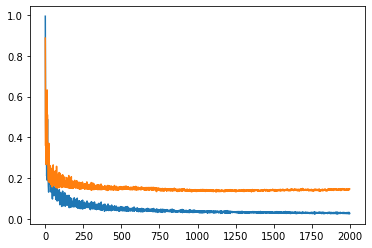

In [37]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [38]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = tcn_norm.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [39]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 0.0682210570643987


# Make predictions based on test set and get a root mean squared error 

In [40]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = tcn_norm.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [41]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 0.17771678573221467


# Plot train labels along with train predictions

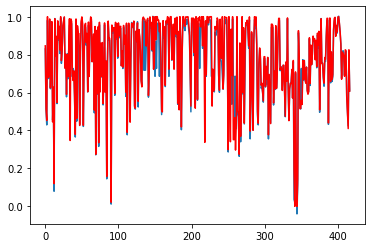

In [42]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

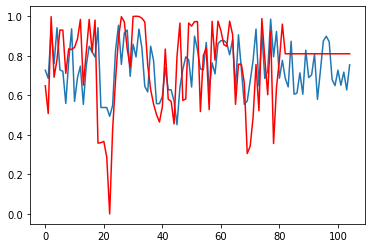

In [43]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with the addition of weather data

In [44]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [45]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []
        
        current_row_components_replaced.append(bridge_id)

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Append the weather data to the end of each time step

In [46]:
start_year = 1998
last_year = 2019

rows = []

df_NOAA = read_csv('NBI_NOAA_Integrated.csv')

for i, example in enumerate(list_of_row_components):
        
        row = df_NOAA.loc[(df_NOAA['STRUCTURE_NUMBER_008'] == list_of_row_components[i][0]) & (df_NOAA['EVALUATION_YEAR'] == start_year)]
        
        if len(row) == 0:
            row = prev_row
        
        for idx, r in row.iterrows():  
            list_of_row_components[i].append(r['prcp_avg'])
            list_of_row_components[i].append(r['snow_avg'])
            list_of_row_components[i].append(r['snwd_avg'])
        
        start_year += 1
        
        if start_year > last_year:
            start_year = 1998
            
        prev_row = row
        prev_row['EVALUATION_YEAR'] = start_year
        

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\IPython\core\interactiveshell.py:3147: DtypeWarning: Columns (19,33,38,39,40,41,43,71,78,81,104,108,109,110,111,116,132,135) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

# Ensure each element in the list of lists is a float

In [47]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [48]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Remove the bridge id's from each time series

In [49]:
for idx, element in enumerate(list_of_row_components):
    list_of_row_components[idx].pop(0)

# View one time series

In [50]:
for i in range(22):
    print(len(list_of_row_components[i]))

10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10


# Get length of list of lists

In [51]:
len(list_of_row_components)

11506

# Convert format of list to have a single time series for each index

In [52]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [53]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [54]:
list_of_examples.shape

(522, 22, 10)

# Perform train test split for dataset

In [55]:
from sklearn.model_selection import train_test_split

n_train_periods = 417
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


In [56]:
train_y = train_y.reshape(417,)
test_y = test_y.reshape(105,)

In [57]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (417, 21, 9)
Shape of train_y: (417,)
Shape of test_X: (105, 21, 9)
Shape of test_y: (105,)


# Build tcn model

In [58]:
from tensorflow.keras.layers import Dense
from tensorflow.keras import Input, Model

from tcn import TCN, tcn_full_summary

batch_size, timesteps, input_dim = None, 21, 9

i = Input(batch_shape=(batch_size, timesteps, input_dim))

o = TCN(return_sequences=False)(i)
o = Dense(1)(o)

tcn_weather = Model(inputs=[i], outputs=[o])
tcn_weather.compile(optimizer='adam', loss='mae')

tcn_full_summary(tcn_weather, expand_residual_blocks=False)

history = tcn_weather.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Model: "functional_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 21, 9)]           0         
_________________________________________________________________
residual_block_0 (ResidualBl [(None, 21, 64), (None, 2 10112     
_________________________________________________________________
residual_block_1 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_2 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_3 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_4 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_5 (ResidualBl [(None, 21, 64), (None, 2

Epoch 106/2000
14/14 - 0s - loss: 292.5751 - val_loss: 188.6891
Epoch 107/2000
14/14 - 0s - loss: 217.6864 - val_loss: 600.3536
Epoch 108/2000
14/14 - 0s - loss: 275.3778 - val_loss: 106.2169
Epoch 109/2000
14/14 - 0s - loss: 256.7809 - val_loss: 225.0712
Epoch 110/2000
14/14 - 0s - loss: 204.3300 - val_loss: 129.7697
Epoch 111/2000
14/14 - 0s - loss: 257.2867 - val_loss: 425.8759
Epoch 112/2000
14/14 - 0s - loss: 333.7430 - val_loss: 500.6645
Epoch 113/2000
14/14 - 0s - loss: 408.7194 - val_loss: 205.1619
Epoch 114/2000
14/14 - 0s - loss: 189.9049 - val_loss: 470.0903
Epoch 115/2000
14/14 - 0s - loss: 408.2066 - val_loss: 110.9452
Epoch 116/2000
14/14 - 0s - loss: 216.8540 - val_loss: 297.0878
Epoch 117/2000
14/14 - 0s - loss: 139.0683 - val_loss: 102.9167
Epoch 118/2000
14/14 - 0s - loss: 223.1377 - val_loss: 205.2228
Epoch 119/2000
14/14 - 0s - loss: 327.3421 - val_loss: 295.1003
Epoch 120/2000
14/14 - 0s - loss: 201.1190 - val_loss: 264.7318
Epoch 121/2000
14/14 - 0s - loss: 281.86

Epoch 235/2000
14/14 - 0s - loss: 375.0503 - val_loss: 752.8458
Epoch 236/2000
14/14 - 0s - loss: 220.9381 - val_loss: 150.5759
Epoch 237/2000
14/14 - 0s - loss: 194.8023 - val_loss: 144.6737
Epoch 238/2000
14/14 - 0s - loss: 375.0516 - val_loss: 144.5844
Epoch 239/2000
14/14 - 0s - loss: 136.8737 - val_loss: 407.6740
Epoch 240/2000
14/14 - 0s - loss: 275.4051 - val_loss: 123.3848
Epoch 241/2000
14/14 - 0s - loss: 140.3738 - val_loss: 290.1542
Epoch 242/2000
14/14 - 0s - loss: 202.5805 - val_loss: 173.1481
Epoch 243/2000
14/14 - 0s - loss: 90.5204 - val_loss: 93.6418
Epoch 244/2000
14/14 - 0s - loss: 101.3957 - val_loss: 83.2493
Epoch 245/2000
14/14 - 0s - loss: 160.6392 - val_loss: 109.8591
Epoch 246/2000
14/14 - 0s - loss: 228.2617 - val_loss: 72.9087
Epoch 247/2000
14/14 - 0s - loss: 118.9734 - val_loss: 178.4950
Epoch 248/2000
14/14 - 0s - loss: 178.8132 - val_loss: 111.7205
Epoch 249/2000
14/14 - 0s - loss: 184.3771 - val_loss: 283.7165
Epoch 250/2000
14/14 - 0s - loss: 302.9424 -

Epoch 365/2000
14/14 - 0s - loss: 88.2676 - val_loss: 92.0086
Epoch 366/2000
14/14 - 0s - loss: 63.0607 - val_loss: 230.6086
Epoch 367/2000
14/14 - 0s - loss: 100.7552 - val_loss: 291.8915
Epoch 368/2000
14/14 - 0s - loss: 185.7762 - val_loss: 70.6601
Epoch 369/2000
14/14 - 0s - loss: 73.5998 - val_loss: 149.8426
Epoch 370/2000
14/14 - 0s - loss: 120.7390 - val_loss: 68.1941
Epoch 371/2000
14/14 - 0s - loss: 70.4029 - val_loss: 141.4371
Epoch 372/2000
14/14 - 0s - loss: 70.4764 - val_loss: 24.6242
Epoch 373/2000
14/14 - 0s - loss: 106.6996 - val_loss: 90.5996
Epoch 374/2000
14/14 - 0s - loss: 70.1854 - val_loss: 237.9816
Epoch 375/2000
14/14 - 0s - loss: 150.2150 - val_loss: 112.1978
Epoch 376/2000
14/14 - 0s - loss: 115.5536 - val_loss: 88.7579
Epoch 377/2000
14/14 - 0s - loss: 137.0181 - val_loss: 54.3154
Epoch 378/2000
14/14 - 0s - loss: 65.9025 - val_loss: 104.0903
Epoch 379/2000
14/14 - 0s - loss: 65.6839 - val_loss: 47.2026
Epoch 380/2000
14/14 - 0s - loss: 108.0294 - val_loss: 6

Epoch 496/2000
14/14 - 0s - loss: 35.5807 - val_loss: 40.6943
Epoch 497/2000
14/14 - 0s - loss: 37.9599 - val_loss: 90.4407
Epoch 498/2000
14/14 - 0s - loss: 85.4372 - val_loss: 30.8124
Epoch 499/2000
14/14 - 0s - loss: 42.9221 - val_loss: 20.5036
Epoch 500/2000
14/14 - 0s - loss: 77.4792 - val_loss: 83.1314
Epoch 501/2000
14/14 - 0s - loss: 55.6537 - val_loss: 167.2077
Epoch 502/2000
14/14 - 0s - loss: 111.4308 - val_loss: 26.3994
Epoch 503/2000
14/14 - 0s - loss: 44.4240 - val_loss: 76.1819
Epoch 504/2000
14/14 - 0s - loss: 42.6046 - val_loss: 111.5437
Epoch 505/2000
14/14 - 0s - loss: 78.3431 - val_loss: 90.4340
Epoch 506/2000
14/14 - 0s - loss: 48.4971 - val_loss: 84.5274
Epoch 507/2000
14/14 - 0s - loss: 55.4165 - val_loss: 76.1912
Epoch 508/2000
14/14 - 0s - loss: 67.4829 - val_loss: 72.8620
Epoch 509/2000
14/14 - 0s - loss: 74.9540 - val_loss: 112.1411
Epoch 510/2000
14/14 - 0s - loss: 55.7677 - val_loss: 97.3127
Epoch 511/2000
14/14 - 0s - loss: 88.3011 - val_loss: 32.5433
Epoc

14/14 - 0s - loss: 97.7449 - val_loss: 58.3298
Epoch 628/2000
14/14 - 0s - loss: 82.1927 - val_loss: 28.7398
Epoch 629/2000
14/14 - 0s - loss: 69.6099 - val_loss: 41.6831
Epoch 630/2000
14/14 - 0s - loss: 72.1890 - val_loss: 96.1671
Epoch 631/2000
14/14 - 0s - loss: 81.1880 - val_loss: 56.1576
Epoch 632/2000
14/14 - 0s - loss: 62.4879 - val_loss: 49.2729
Epoch 633/2000
14/14 - 0s - loss: 76.4881 - val_loss: 34.0579
Epoch 634/2000
14/14 - 0s - loss: 58.1453 - val_loss: 39.9221
Epoch 635/2000
14/14 - 0s - loss: 38.1268 - val_loss: 29.5622
Epoch 636/2000
14/14 - 0s - loss: 61.5283 - val_loss: 80.3275
Epoch 637/2000
14/14 - 0s - loss: 45.7637 - val_loss: 58.5282
Epoch 638/2000
14/14 - 0s - loss: 62.7396 - val_loss: 39.0118
Epoch 639/2000
14/14 - 0s - loss: 69.5227 - val_loss: 75.0012
Epoch 640/2000
14/14 - 0s - loss: 48.0919 - val_loss: 54.8108
Epoch 641/2000
14/14 - 0s - loss: 85.8053 - val_loss: 290.8136
Epoch 642/2000
14/14 - 0s - loss: 79.6052 - val_loss: 66.3834
Epoch 643/2000
14/14 -

Epoch 759/2000
14/14 - 0s - loss: 31.0250 - val_loss: 23.2654
Epoch 760/2000
14/14 - 0s - loss: 53.8984 - val_loss: 29.3668
Epoch 761/2000
14/14 - 0s - loss: 38.0080 - val_loss: 142.8566
Epoch 762/2000
14/14 - 0s - loss: 54.2082 - val_loss: 16.3251
Epoch 763/2000
14/14 - 0s - loss: 18.7239 - val_loss: 23.1275
Epoch 764/2000
14/14 - 0s - loss: 54.7727 - val_loss: 28.2620
Epoch 765/2000
14/14 - 0s - loss: 76.5995 - val_loss: 14.6057
Epoch 766/2000
14/14 - 0s - loss: 53.1371 - val_loss: 17.7394
Epoch 767/2000
14/14 - 0s - loss: 41.7879 - val_loss: 31.4981
Epoch 768/2000
14/14 - 0s - loss: 31.8191 - val_loss: 26.0783
Epoch 769/2000
14/14 - 0s - loss: 62.2492 - val_loss: 68.7248
Epoch 770/2000
14/14 - 0s - loss: 31.2557 - val_loss: 43.5929
Epoch 771/2000
14/14 - 0s - loss: 34.7766 - val_loss: 34.1440
Epoch 772/2000
14/14 - 0s - loss: 30.8048 - val_loss: 15.7525
Epoch 773/2000
14/14 - 0s - loss: 50.6180 - val_loss: 43.1462
Epoch 774/2000
14/14 - 0s - loss: 60.9268 - val_loss: 21.3977
Epoch 7

Epoch 891/2000
14/14 - 0s - loss: 48.3684 - val_loss: 60.5448
Epoch 892/2000
14/14 - 0s - loss: 67.3575 - val_loss: 13.7851
Epoch 893/2000
14/14 - 0s - loss: 47.7252 - val_loss: 27.0543
Epoch 894/2000
14/14 - 0s - loss: 50.2917 - val_loss: 24.5747
Epoch 895/2000
14/14 - 0s - loss: 48.3640 - val_loss: 23.1685
Epoch 896/2000
14/14 - 0s - loss: 24.7336 - val_loss: 100.6028
Epoch 897/2000
14/14 - 0s - loss: 62.6358 - val_loss: 53.1768
Epoch 898/2000
14/14 - 0s - loss: 44.3767 - val_loss: 29.1091
Epoch 899/2000
14/14 - 0s - loss: 29.4462 - val_loss: 35.5759
Epoch 900/2000
14/14 - 0s - loss: 46.8325 - val_loss: 22.4068
Epoch 901/2000
14/14 - 0s - loss: 22.2134 - val_loss: 21.4949
Epoch 902/2000
14/14 - 0s - loss: 15.7562 - val_loss: 128.9793
Epoch 903/2000
14/14 - 0s - loss: 47.2839 - val_loss: 112.0906
Epoch 904/2000
14/14 - 0s - loss: 63.8502 - val_loss: 29.5198
Epoch 905/2000
14/14 - 0s - loss: 29.9525 - val_loss: 120.5663
Epoch 906/2000
14/14 - 0s - loss: 46.3625 - val_loss: 102.0345
Epo

Epoch 1023/2000
14/14 - 0s - loss: 34.9371 - val_loss: 71.8411
Epoch 1024/2000
14/14 - 0s - loss: 60.0735 - val_loss: 16.6075
Epoch 1025/2000
14/14 - 0s - loss: 22.2634 - val_loss: 55.2044
Epoch 1026/2000
14/14 - 0s - loss: 41.6933 - val_loss: 15.3523
Epoch 1027/2000
14/14 - 0s - loss: 50.0716 - val_loss: 17.4644
Epoch 1028/2000
14/14 - 0s - loss: 57.2580 - val_loss: 44.5285
Epoch 1029/2000
14/14 - 0s - loss: 48.0946 - val_loss: 15.1877
Epoch 1030/2000
14/14 - 0s - loss: 16.7386 - val_loss: 37.1859
Epoch 1031/2000
14/14 - 0s - loss: 48.1585 - val_loss: 38.9077
Epoch 1032/2000
14/14 - 0s - loss: 57.9023 - val_loss: 13.6214
Epoch 1033/2000
14/14 - 0s - loss: 58.7258 - val_loss: 183.2517
Epoch 1034/2000
14/14 - 0s - loss: 47.0005 - val_loss: 63.6002
Epoch 1035/2000
14/14 - 0s - loss: 56.4169 - val_loss: 26.7006
Epoch 1036/2000
14/14 - 0s - loss: 42.5169 - val_loss: 14.3863
Epoch 1037/2000
14/14 - 0s - loss: 22.6525 - val_loss: 43.6923
Epoch 1038/2000
14/14 - 0s - loss: 47.0658 - val_loss:

Epoch 1153/2000
14/14 - 0s - loss: 33.7106 - val_loss: 40.7869
Epoch 1154/2000
14/14 - 0s - loss: 19.5589 - val_loss: 38.7584
Epoch 1155/2000
14/14 - 0s - loss: 39.2512 - val_loss: 19.7886
Epoch 1156/2000
14/14 - 0s - loss: 33.3192 - val_loss: 33.0147
Epoch 1157/2000
14/14 - 0s - loss: 26.1649 - val_loss: 95.0116
Epoch 1158/2000
14/14 - 0s - loss: 40.0866 - val_loss: 71.2391
Epoch 1159/2000
14/14 - 0s - loss: 71.6838 - val_loss: 152.5407
Epoch 1160/2000
14/14 - 0s - loss: 48.1845 - val_loss: 40.3688
Epoch 1161/2000
14/14 - 0s - loss: 36.9789 - val_loss: 51.2666
Epoch 1162/2000
14/14 - 0s - loss: 55.5588 - val_loss: 12.9578
Epoch 1163/2000
14/14 - 0s - loss: 21.6442 - val_loss: 32.0590
Epoch 1164/2000
14/14 - 0s - loss: 16.9462 - val_loss: 23.5699
Epoch 1165/2000
14/14 - 0s - loss: 14.7732 - val_loss: 38.3846
Epoch 1166/2000
14/14 - 0s - loss: 19.5955 - val_loss: 89.5300
Epoch 1167/2000
14/14 - 0s - loss: 33.2345 - val_loss: 12.5878
Epoch 1168/2000
14/14 - 0s - loss: 40.2438 - val_loss:

14/14 - 0s - loss: 34.6016 - val_loss: 49.3581
Epoch 1283/2000
14/14 - 0s - loss: 56.3965 - val_loss: 182.6553
Epoch 1284/2000
14/14 - 0s - loss: 51.4330 - val_loss: 38.9053
Epoch 1285/2000
14/14 - 0s - loss: 51.5217 - val_loss: 155.4748
Epoch 1286/2000
14/14 - 0s - loss: 39.4277 - val_loss: 47.0303
Epoch 1287/2000
14/14 - 0s - loss: 47.7493 - val_loss: 29.9059
Epoch 1288/2000
14/14 - 0s - loss: 22.1201 - val_loss: 23.4696
Epoch 1289/2000
14/14 - 0s - loss: 18.4502 - val_loss: 32.8336
Epoch 1290/2000
14/14 - 0s - loss: 40.6788 - val_loss: 33.8605
Epoch 1291/2000
14/14 - 0s - loss: 30.2977 - val_loss: 39.9980
Epoch 1292/2000
14/14 - 0s - loss: 54.4711 - val_loss: 26.6720
Epoch 1293/2000
14/14 - 0s - loss: 35.9676 - val_loss: 8.8349
Epoch 1294/2000
14/14 - 0s - loss: 22.1950 - val_loss: 88.1851
Epoch 1295/2000
14/14 - 0s - loss: 32.7846 - val_loss: 31.9424
Epoch 1296/2000
14/14 - 0s - loss: 16.5199 - val_loss: 78.8734
Epoch 1297/2000
14/14 - 0s - loss: 44.3885 - val_loss: 17.5727
Epoch 1

14/14 - 0s - loss: 44.8585 - val_loss: 13.8426
Epoch 1413/2000
14/14 - 0s - loss: 31.0408 - val_loss: 9.9879
Epoch 1414/2000
14/14 - 0s - loss: 12.4974 - val_loss: 92.4162
Epoch 1415/2000
14/14 - 0s - loss: 57.6824 - val_loss: 28.7084
Epoch 1416/2000
14/14 - 0s - loss: 24.4031 - val_loss: 103.0825
Epoch 1417/2000
14/14 - 0s - loss: 75.1918 - val_loss: 186.3754
Epoch 1418/2000
14/14 - 0s - loss: 82.4005 - val_loss: 42.0480
Epoch 1419/2000
14/14 - 0s - loss: 31.5039 - val_loss: 37.3222
Epoch 1420/2000
14/14 - 0s - loss: 28.7147 - val_loss: 66.6726
Epoch 1421/2000
14/14 - 0s - loss: 53.8135 - val_loss: 28.4047
Epoch 1422/2000
14/14 - 0s - loss: 16.5021 - val_loss: 34.2861
Epoch 1423/2000
14/14 - 0s - loss: 37.9916 - val_loss: 17.1743
Epoch 1424/2000
14/14 - 0s - loss: 41.2155 - val_loss: 17.0453
Epoch 1425/2000
14/14 - 0s - loss: 38.4694 - val_loss: 10.6428
Epoch 1426/2000
14/14 - 0s - loss: 20.4695 - val_loss: 19.7330
Epoch 1427/2000
14/14 - 0s - loss: 35.7468 - val_loss: 45.0305
Epoch 1

Epoch 1542/2000
14/14 - 0s - loss: 38.9295 - val_loss: 25.5028
Epoch 1543/2000
14/14 - 0s - loss: 33.7914 - val_loss: 16.8972
Epoch 1544/2000
14/14 - 0s - loss: 21.5136 - val_loss: 82.9964
Epoch 1545/2000
14/14 - 0s - loss: 52.9748 - val_loss: 19.0524
Epoch 1546/2000
14/14 - 0s - loss: 27.1854 - val_loss: 86.9402
Epoch 1547/2000
14/14 - 0s - loss: 47.8328 - val_loss: 20.4682
Epoch 1548/2000
14/14 - 0s - loss: 53.9777 - val_loss: 159.8349
Epoch 1549/2000
14/14 - 0s - loss: 64.9517 - val_loss: 31.1056
Epoch 1550/2000
14/14 - 0s - loss: 22.4759 - val_loss: 58.6509
Epoch 1551/2000
14/14 - 0s - loss: 51.6078 - val_loss: 32.7963
Epoch 1552/2000
14/14 - 0s - loss: 20.2174 - val_loss: 20.7684
Epoch 1553/2000
14/14 - 0s - loss: 54.3075 - val_loss: 147.9387
Epoch 1554/2000
14/14 - 0s - loss: 61.7877 - val_loss: 22.4836
Epoch 1555/2000
14/14 - 0s - loss: 25.0404 - val_loss: 79.5472
Epoch 1556/2000
14/14 - 0s - loss: 44.8973 - val_loss: 16.7366
Epoch 1557/2000
14/14 - 0s - loss: 12.8775 - val_loss

Epoch 1672/2000
14/14 - 0s - loss: 43.4909 - val_loss: 22.7805
Epoch 1673/2000
14/14 - 0s - loss: 36.2679 - val_loss: 37.4826
Epoch 1674/2000
14/14 - 0s - loss: 22.4781 - val_loss: 38.7065
Epoch 1675/2000
14/14 - 0s - loss: 52.6402 - val_loss: 150.7900
Epoch 1676/2000
14/14 - 0s - loss: 60.3785 - val_loss: 22.4466
Epoch 1677/2000
14/14 - 0s - loss: 26.4480 - val_loss: 81.3822
Epoch 1678/2000
14/14 - 0s - loss: 49.7642 - val_loss: 24.2841
Epoch 1679/2000
14/14 - 0s - loss: 25.9074 - val_loss: 43.4378
Epoch 1680/2000
14/14 - 0s - loss: 47.7196 - val_loss: 33.6715
Epoch 1681/2000
14/14 - 0s - loss: 35.0180 - val_loss: 13.6018
Epoch 1682/2000
14/14 - 0s - loss: 37.7488 - val_loss: 16.1127
Epoch 1683/2000
14/14 - 0s - loss: 18.3867 - val_loss: 37.9310
Epoch 1684/2000
14/14 - 0s - loss: 38.9551 - val_loss: 22.7709
Epoch 1685/2000
14/14 - 0s - loss: 26.5213 - val_loss: 45.3066
Epoch 1686/2000
14/14 - 0s - loss: 49.4196 - val_loss: 178.7879
Epoch 1687/2000
14/14 - 0s - loss: 66.2134 - val_loss

Epoch 1801/2000
14/14 - 0s - loss: 267.1797 - val_loss: 43.8545
Epoch 1802/2000
14/14 - 0s - loss: 242.7474 - val_loss: 23.1273
Epoch 1803/2000
14/14 - 0s - loss: 274.9686 - val_loss: 53.8249
Epoch 1804/2000
14/14 - 0s - loss: 240.7460 - val_loss: 24.1826
Epoch 1805/2000
14/14 - 0s - loss: 271.8934 - val_loss: 50.3473
Epoch 1806/2000
14/14 - 0s - loss: 243.3219 - val_loss: 27.8283
Epoch 1807/2000
14/14 - 0s - loss: 268.0185 - val_loss: 46.5684
Epoch 1808/2000
14/14 - 0s - loss: 238.0663 - val_loss: 20.3527
Epoch 1809/2000
14/14 - 0s - loss: 276.3287 - val_loss: 57.0903
Epoch 1810/2000
14/14 - 0s - loss: 239.9427 - val_loss: 26.4018
Epoch 1811/2000
14/14 - 0s - loss: 268.2852 - val_loss: 48.8180
Epoch 1812/2000
14/14 - 0s - loss: 235.1566 - val_loss: 18.4549
Epoch 1813/2000
14/14 - 0s - loss: 277.0713 - val_loss: 59.6536
Epoch 1814/2000
14/14 - 0s - loss: 187.4953 - val_loss: 495.7182
Epoch 1815/2000
14/14 - 0s - loss: 375.8274 - val_loss: 624.9100
Epoch 1816/2000
14/14 - 0s - loss: 183

Epoch 1929/2000
14/14 - 0s - loss: 239.2939 - val_loss: 49.8678
Epoch 1930/2000
14/14 - 0s - loss: 224.8069 - val_loss: 30.8453
Epoch 1931/2000
14/14 - 0s - loss: 232.9465 - val_loss: 41.2565
Epoch 1932/2000
14/14 - 0s - loss: 227.2720 - val_loss: 31.9662
Epoch 1933/2000
14/14 - 0s - loss: 237.6877 - val_loss: 47.4331
Epoch 1934/2000
14/14 - 0s - loss: 226.3772 - val_loss: 33.5285
Epoch 1935/2000
14/14 - 0s - loss: 237.7134 - val_loss: 49.2896
Epoch 1936/2000
14/14 - 0s - loss: 223.7521 - val_loss: 30.6865
Epoch 1937/2000
14/14 - 0s - loss: 232.3152 - val_loss: 41.1269
Epoch 1938/2000
14/14 - 0s - loss: 230.1906 - val_loss: 38.1302
Epoch 1939/2000
14/14 - 0s - loss: 234.1341 - val_loss: 45.3026
Epoch 1940/2000
14/14 - 0s - loss: 226.7995 - val_loss: 35.2610
Epoch 1941/2000
14/14 - 0s - loss: 235.2993 - val_loss: 47.5604
Epoch 1942/2000
14/14 - 0s - loss: 224.2400 - val_loss: 32.0107
Epoch 1943/2000
14/14 - 0s - loss: 234.3883 - val_loss: 45.9304
Epoch 1944/2000
14/14 - 0s - loss: 225.0

# Plot model loss and validation loss

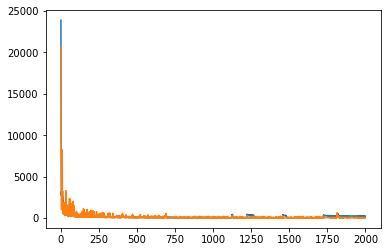

In [59]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [60]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = tcn_weather.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [61]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 49.96832052150728


# Make predictions based on test set and get a root mean squared error 

In [62]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = tcn_weather.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [63]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 48.30184116641356


# Plot train labels along with train predictions

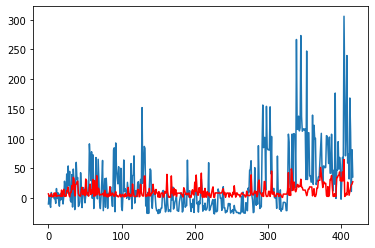

In [64]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

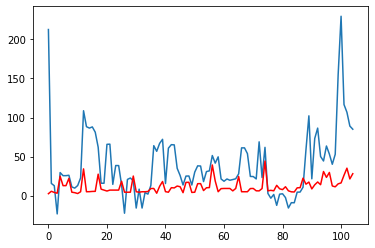

In [65]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with both the addition of weather data and normalization

In [66]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_Final.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [67]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 524):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []
        
        current_row_components_replaced.append(bridge_id)

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Append the weather data to the end of each time step

In [68]:
start_year = 1998
last_year = 2019

rows = []

df_NOAA = read_csv('NBI_NOAA_Integrated.csv')

for i, example in enumerate(list_of_row_components):
        
        row = df_NOAA.loc[(df_NOAA['STRUCTURE_NUMBER_008'] == list_of_row_components[i][0]) & (df_NOAA['EVALUATION_YEAR'] == start_year)]
        
        if len(row) == 0:
            row = prev_row
        
        for idx, r in row.iterrows():  
            list_of_row_components[i].append(r['prcp_avg'])
            list_of_row_components[i].append(r['snow_avg'])
            list_of_row_components[i].append(r['snwd_avg'])
        
        start_year += 1
        
        if start_year > last_year:
            start_year = 1998
            
        prev_row = row
        prev_row['EVALUATION_YEAR'] = start_year
        

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\IPython\core\interactiveshell.py:3147: DtypeWarning: Columns (19,33,38,39,40,41,43,71,78,81,104,108,109,110,111,116,132,135) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: htt

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
C:\Users\tobby\Anaconda3\envs\tf_bridge_management\lib\site-packages\ipykernel_launcher.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value

# Ensure each element in the list of lists is a float

In [69]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [70]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Remove the bridge id's from each time series

In [71]:
for idx, element in enumerate(list_of_row_components):
    list_of_row_components[idx].pop(0)

# View one time series

In [72]:
for i in range(22):
    print(len(list_of_row_components[i]))

10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10
10


# Get length of list of lists

In [73]:
len(list_of_row_components)

11506

# Convert format of list to have a single time series for each index

In [74]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [75]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [76]:
list_of_examples.shape

(522, 22, 10)

# Perform train test split for dataset

In [77]:
from sklearn.model_selection import train_test_split

n_train_periods = 417
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


# Apply MinMaxScaler on data

In [78]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

for idx, x in enumerate(train_X):
    train_X[idx] = scaler.fit_transform(x)

train_y = scaler.fit_transform(train_y.reshape(-1,1))

for idx, x in enumerate(test_X):
    test_X[idx] = scaler.fit_transform(x)

test_y = scaler.fit_transform(test_y.reshape(-1,1))

In [79]:
train_y = train_y.reshape(417,)
test_y = test_y.reshape(105,)

In [80]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (417, 21, 9)
Shape of train_y: (417,)
Shape of test_X: (105, 21, 9)
Shape of test_y: (105,)


# Build tcn model

In [81]:
from tensorflow.keras.layers import Dense
from tensorflow.keras import Input, Model

from tcn import TCN, tcn_full_summary

batch_size, timesteps, input_dim = None, 21, 9

i = Input(batch_shape=(batch_size, timesteps, input_dim))

o = TCN(return_sequences=False)(i)
o = Dense(1)(o)

tcn_both = Model(inputs=[i], outputs=[o])
tcn_both.compile(optimizer='adam', loss='mae')

tcn_full_summary(tcn_both, expand_residual_blocks=False)

history = tcn_both.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Model: "functional_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 21, 9)]           0         
_________________________________________________________________
residual_block_0 (ResidualBl [(None, 21, 64), (None, 2 10112     
_________________________________________________________________
residual_block_1 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_2 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_3 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_4 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_5 (ResidualBl [(None, 21, 64), (None, 2

Epoch 114/2000
14/14 - 0s - loss: 0.0757 - val_loss: 0.2250
Epoch 115/2000
14/14 - 0s - loss: 0.1324 - val_loss: 0.1519
Epoch 116/2000
14/14 - 0s - loss: 0.0523 - val_loss: 0.1582
Epoch 117/2000
14/14 - 0s - loss: 0.0427 - val_loss: 0.1574
Epoch 118/2000
14/14 - 0s - loss: 0.0367 - val_loss: 0.1535
Epoch 119/2000
14/14 - 0s - loss: 0.0502 - val_loss: 0.1732
Epoch 120/2000
14/14 - 0s - loss: 0.0898 - val_loss: 0.1591
Epoch 121/2000
14/14 - 0s - loss: 0.0675 - val_loss: 0.1633
Epoch 122/2000
14/14 - 0s - loss: 0.0557 - val_loss: 0.1607
Epoch 123/2000
14/14 - 0s - loss: 0.0416 - val_loss: 0.1696
Epoch 124/2000
14/14 - 0s - loss: 0.0822 - val_loss: 0.1628
Epoch 125/2000
14/14 - 0s - loss: 0.0791 - val_loss: 0.2350
Epoch 126/2000
14/14 - 0s - loss: 0.1261 - val_loss: 0.1569
Epoch 127/2000
14/14 - 0s - loss: 0.0453 - val_loss: 0.1606
Epoch 128/2000
14/14 - 0s - loss: 0.0453 - val_loss: 0.1524
Epoch 129/2000
14/14 - 0s - loss: 0.0431 - val_loss: 0.1515
Epoch 130/2000
14/14 - 0s - loss: 0.0502

Epoch 251/2000
14/14 - 0s - loss: 0.0521 - val_loss: 0.1606
Epoch 252/2000
14/14 - 0s - loss: 0.0477 - val_loss: 0.1673
Epoch 253/2000
14/14 - 0s - loss: 0.0464 - val_loss: 0.1533
Epoch 254/2000
14/14 - 0s - loss: 0.0360 - val_loss: 0.1512
Epoch 255/2000
14/14 - 0s - loss: 0.0557 - val_loss: 0.1535
Epoch 256/2000
14/14 - 0s - loss: 0.0506 - val_loss: 0.1664
Epoch 257/2000
14/14 - 0s - loss: 0.0546 - val_loss: 0.1620
Epoch 258/2000
14/14 - 0s - loss: 0.0489 - val_loss: 0.1501
Epoch 259/2000
14/14 - 0s - loss: 0.0552 - val_loss: 0.1495
Epoch 260/2000
14/14 - 0s - loss: 0.0550 - val_loss: 0.1689
Epoch 261/2000
14/14 - 0s - loss: 0.0526 - val_loss: 0.1457
Epoch 262/2000
14/14 - 0s - loss: 0.0261 - val_loss: 0.1505
Epoch 263/2000
14/14 - 0s - loss: 0.0361 - val_loss: 0.1450
Epoch 264/2000
14/14 - 0s - loss: 0.0450 - val_loss: 0.1573
Epoch 265/2000
14/14 - 0s - loss: 0.0539 - val_loss: 0.1540
Epoch 266/2000
14/14 - 0s - loss: 0.0404 - val_loss: 0.1541
Epoch 267/2000
14/14 - 0s - loss: 0.0280

Epoch 388/2000
14/14 - 0s - loss: 0.0199 - val_loss: 0.1460
Epoch 389/2000
14/14 - 0s - loss: 0.0349 - val_loss: 0.1453
Epoch 390/2000
14/14 - 0s - loss: 0.0267 - val_loss: 0.1513
Epoch 391/2000
14/14 - 0s - loss: 0.0364 - val_loss: 0.1469
Epoch 392/2000
14/14 - 0s - loss: 0.0308 - val_loss: 0.1462
Epoch 393/2000
14/14 - 0s - loss: 0.0410 - val_loss: 0.1461
Epoch 394/2000
14/14 - 0s - loss: 0.0379 - val_loss: 0.1535
Epoch 395/2000
14/14 - 0s - loss: 0.0391 - val_loss: 0.1497
Epoch 396/2000
14/14 - 0s - loss: 0.0268 - val_loss: 0.1469
Epoch 397/2000
14/14 - 0s - loss: 0.0305 - val_loss: 0.1464
Epoch 398/2000
14/14 - 0s - loss: 0.0404 - val_loss: 0.1558
Epoch 399/2000
14/14 - 0s - loss: 0.0458 - val_loss: 0.1464
Epoch 400/2000
14/14 - 0s - loss: 0.0230 - val_loss: 0.1508
Epoch 401/2000
14/14 - 0s - loss: 0.0207 - val_loss: 0.1472
Epoch 402/2000
14/14 - 0s - loss: 0.0368 - val_loss: 0.1455
Epoch 403/2000
14/14 - 0s - loss: 0.0349 - val_loss: 0.1540
Epoch 404/2000
14/14 - 0s - loss: 0.0429

Epoch 525/2000
14/14 - 0s - loss: 0.0317 - val_loss: 0.1462
Epoch 526/2000
14/14 - 0s - loss: 0.0301 - val_loss: 0.1469
Epoch 527/2000
14/14 - 0s - loss: 0.0331 - val_loss: 0.1439
Epoch 528/2000
14/14 - 0s - loss: 0.0226 - val_loss: 0.1431
Epoch 529/2000
14/14 - 0s - loss: 0.0189 - val_loss: 0.1411
Epoch 530/2000
14/14 - 0s - loss: 0.0216 - val_loss: 0.1473
Epoch 531/2000
14/14 - 0s - loss: 0.0370 - val_loss: 0.1428
Epoch 532/2000
14/14 - 0s - loss: 0.0214 - val_loss: 0.1476
Epoch 533/2000
14/14 - 0s - loss: 0.0251 - val_loss: 0.1443
Epoch 534/2000
14/14 - 0s - loss: 0.0272 - val_loss: 0.1496
Epoch 535/2000
14/14 - 0s - loss: 0.0338 - val_loss: 0.1434
Epoch 536/2000
14/14 - 0s - loss: 0.0224 - val_loss: 0.1430
Epoch 537/2000
14/14 - 0s - loss: 0.0242 - val_loss: 0.1440
Epoch 538/2000
14/14 - 0s - loss: 0.0325 - val_loss: 0.1443
Epoch 539/2000
14/14 - 0s - loss: 0.0279 - val_loss: 0.1439
Epoch 540/2000
14/14 - 0s - loss: 0.0229 - val_loss: 0.1434
Epoch 541/2000
14/14 - 0s - loss: 0.0283

Epoch 662/2000
14/14 - 0s - loss: 0.0262 - val_loss: 0.1410
Epoch 663/2000
14/14 - 0s - loss: 0.0159 - val_loss: 0.1417
Epoch 664/2000
14/14 - 0s - loss: 0.0166 - val_loss: 0.1431
Epoch 665/2000
14/14 - 0s - loss: 0.0193 - val_loss: 0.1428
Epoch 666/2000
14/14 - 0s - loss: 0.0187 - val_loss: 0.1426
Epoch 667/2000
14/14 - 0s - loss: 0.0250 - val_loss: 0.1430
Epoch 668/2000
14/14 - 0s - loss: 0.0235 - val_loss: 0.1416
Epoch 669/2000
14/14 - 0s - loss: 0.0221 - val_loss: 0.1392
Epoch 670/2000
14/14 - 0s - loss: 0.0198 - val_loss: 0.1414
Epoch 671/2000
14/14 - 0s - loss: 0.0232 - val_loss: 0.1431
Epoch 672/2000
14/14 - 0s - loss: 0.0288 - val_loss: 0.1428
Epoch 673/2000
14/14 - 0s - loss: 0.0216 - val_loss: 0.1415
Epoch 674/2000
14/14 - 0s - loss: 0.0224 - val_loss: 0.1429
Epoch 675/2000
14/14 - 0s - loss: 0.0245 - val_loss: 0.1435
Epoch 676/2000
14/14 - 0s - loss: 0.0190 - val_loss: 0.1428
Epoch 677/2000
14/14 - 0s - loss: 0.0196 - val_loss: 0.1407
Epoch 678/2000
14/14 - 0s - loss: 0.0212

Epoch 799/2000
14/14 - 0s - loss: 0.0242 - val_loss: 0.1432
Epoch 800/2000
14/14 - 0s - loss: 0.0195 - val_loss: 0.1425
Epoch 801/2000
14/14 - 0s - loss: 0.0181 - val_loss: 0.1420
Epoch 802/2000
14/14 - 0s - loss: 0.0213 - val_loss: 0.1434
Epoch 803/2000
14/14 - 0s - loss: 0.0186 - val_loss: 0.1431
Epoch 804/2000
14/14 - 0s - loss: 0.0198 - val_loss: 0.1397
Epoch 805/2000
14/14 - 0s - loss: 0.0167 - val_loss: 0.1421
Epoch 806/2000
14/14 - 0s - loss: 0.0210 - val_loss: 0.1424
Epoch 807/2000
14/14 - 0s - loss: 0.0207 - val_loss: 0.1428
Epoch 808/2000
14/14 - 0s - loss: 0.0209 - val_loss: 0.1418
Epoch 809/2000
14/14 - 0s - loss: 0.0170 - val_loss: 0.1409
Epoch 810/2000
14/14 - 0s - loss: 0.0224 - val_loss: 0.1398
Epoch 811/2000
14/14 - 0s - loss: 0.0118 - val_loss: 0.1408
Epoch 812/2000
14/14 - 0s - loss: 0.0127 - val_loss: 0.1406
Epoch 813/2000
14/14 - 0s - loss: 0.0131 - val_loss: 0.1412
Epoch 814/2000
14/14 - 0s - loss: 0.0156 - val_loss: 0.1419
Epoch 815/2000
14/14 - 0s - loss: 0.0185

Epoch 936/2000
14/14 - 0s - loss: 0.0162 - val_loss: 0.1420
Epoch 937/2000
14/14 - 0s - loss: 0.0180 - val_loss: 0.1424
Epoch 938/2000
14/14 - 0s - loss: 0.0203 - val_loss: 0.1431
Epoch 939/2000
14/14 - 0s - loss: 0.0167 - val_loss: 0.1433
Epoch 940/2000
14/14 - 0s - loss: 0.0178 - val_loss: 0.1399
Epoch 941/2000
14/14 - 0s - loss: 0.0158 - val_loss: 0.1404
Epoch 942/2000
14/14 - 0s - loss: 0.0181 - val_loss: 0.1420
Epoch 943/2000
14/14 - 0s - loss: 0.0147 - val_loss: 0.1438
Epoch 944/2000
14/14 - 0s - loss: 0.0190 - val_loss: 0.1428
Epoch 945/2000
14/14 - 0s - loss: 0.0208 - val_loss: 0.1420
Epoch 946/2000
14/14 - 0s - loss: 0.0193 - val_loss: 0.1421
Epoch 947/2000
14/14 - 0s - loss: 0.0139 - val_loss: 0.1428
Epoch 948/2000
14/14 - 0s - loss: 0.0120 - val_loss: 0.1422
Epoch 949/2000
14/14 - 0s - loss: 0.0151 - val_loss: 0.1434
Epoch 950/2000
14/14 - 0s - loss: 0.0209 - val_loss: 0.1445
Epoch 951/2000
14/14 - 0s - loss: 0.0164 - val_loss: 0.1422
Epoch 952/2000
14/14 - 0s - loss: 0.0148

Epoch 1072/2000
14/14 - 0s - loss: 0.0153 - val_loss: 0.1448
Epoch 1073/2000
14/14 - 0s - loss: 0.0164 - val_loss: 0.1432
Epoch 1074/2000
14/14 - 0s - loss: 0.0159 - val_loss: 0.1419
Epoch 1075/2000
14/14 - 0s - loss: 0.0156 - val_loss: 0.1430
Epoch 1076/2000
14/14 - 0s - loss: 0.0159 - val_loss: 0.1432
Epoch 1077/2000
14/14 - 0s - loss: 0.0125 - val_loss: 0.1448
Epoch 1078/2000
14/14 - 0s - loss: 0.0135 - val_loss: 0.1438
Epoch 1079/2000
14/14 - 0s - loss: 0.0162 - val_loss: 0.1428
Epoch 1080/2000
14/14 - 0s - loss: 0.0175 - val_loss: 0.1421
Epoch 1081/2000
14/14 - 0s - loss: 0.0119 - val_loss: 0.1433
Epoch 1082/2000
14/14 - 0s - loss: 0.0130 - val_loss: 0.1436
Epoch 1083/2000
14/14 - 0s - loss: 0.0145 - val_loss: 0.1431
Epoch 1084/2000
14/14 - 0s - loss: 0.0204 - val_loss: 0.1439
Epoch 1085/2000
14/14 - 0s - loss: 0.0123 - val_loss: 0.1439
Epoch 1086/2000
14/14 - 0s - loss: 0.0150 - val_loss: 0.1432
Epoch 1087/2000
14/14 - 0s - loss: 0.0112 - val_loss: 0.1439
Epoch 1088/2000
14/14 - 

Epoch 1207/2000
14/14 - 0s - loss: 0.0147 - val_loss: 0.1444
Epoch 1208/2000
14/14 - 0s - loss: 0.0179 - val_loss: 0.1452
Epoch 1209/2000
14/14 - 0s - loss: 0.0148 - val_loss: 0.1451
Epoch 1210/2000
14/14 - 0s - loss: 0.0114 - val_loss: 0.1452
Epoch 1211/2000
14/14 - 0s - loss: 0.0139 - val_loss: 0.1455
Epoch 1212/2000
14/14 - 0s - loss: 0.0148 - val_loss: 0.1451
Epoch 1213/2000
14/14 - 0s - loss: 0.0167 - val_loss: 0.1444
Epoch 1214/2000
14/14 - 0s - loss: 0.0152 - val_loss: 0.1452
Epoch 1215/2000
14/14 - 0s - loss: 0.0172 - val_loss: 0.1456
Epoch 1216/2000
14/14 - 0s - loss: 0.0120 - val_loss: 0.1445
Epoch 1217/2000
14/14 - 0s - loss: 0.0123 - val_loss: 0.1445
Epoch 1218/2000
14/14 - 0s - loss: 0.0128 - val_loss: 0.1447
Epoch 1219/2000
14/14 - 0s - loss: 0.0179 - val_loss: 0.1463
Epoch 1220/2000
14/14 - 0s - loss: 0.0203 - val_loss: 0.1457
Epoch 1221/2000
14/14 - 0s - loss: 0.0156 - val_loss: 0.1473
Epoch 1222/2000
14/14 - 0s - loss: 0.0164 - val_loss: 0.1438
Epoch 1223/2000
14/14 - 

Epoch 1342/2000
14/14 - 0s - loss: 0.0153 - val_loss: 0.1462
Epoch 1343/2000
14/14 - 0s - loss: 0.0119 - val_loss: 0.1463
Epoch 1344/2000
14/14 - 0s - loss: 0.0122 - val_loss: 0.1439
Epoch 1345/2000
14/14 - 0s - loss: 0.0141 - val_loss: 0.1439
Epoch 1346/2000
14/14 - 0s - loss: 0.0151 - val_loss: 0.1471
Epoch 1347/2000
14/14 - 0s - loss: 0.0154 - val_loss: 0.1467
Epoch 1348/2000
14/14 - 0s - loss: 0.0172 - val_loss: 0.1464
Epoch 1349/2000
14/14 - 0s - loss: 0.0127 - val_loss: 0.1466
Epoch 1350/2000
14/14 - 0s - loss: 0.0136 - val_loss: 0.1468
Epoch 1351/2000
14/14 - 0s - loss: 0.0116 - val_loss: 0.1456
Epoch 1352/2000
14/14 - 0s - loss: 0.0149 - val_loss: 0.1466
Epoch 1353/2000
14/14 - 0s - loss: 0.0189 - val_loss: 0.1474
Epoch 1354/2000
14/14 - 0s - loss: 0.0155 - val_loss: 0.1493
Epoch 1355/2000
14/14 - 0s - loss: 0.0138 - val_loss: 0.1476
Epoch 1356/2000
14/14 - 0s - loss: 0.0117 - val_loss: 0.1468
Epoch 1357/2000
14/14 - 0s - loss: 0.0142 - val_loss: 0.1465
Epoch 1358/2000
14/14 - 

Epoch 1477/2000
14/14 - 0s - loss: 0.0105 - val_loss: 0.1469
Epoch 1478/2000
14/14 - 0s - loss: 0.0117 - val_loss: 0.1474
Epoch 1479/2000
14/14 - 0s - loss: 0.0104 - val_loss: 0.1474
Epoch 1480/2000
14/14 - 0s - loss: 0.0128 - val_loss: 0.1470
Epoch 1481/2000
14/14 - 0s - loss: 0.0119 - val_loss: 0.1454
Epoch 1482/2000
14/14 - 0s - loss: 0.0148 - val_loss: 0.1467
Epoch 1483/2000
14/14 - 0s - loss: 0.0109 - val_loss: 0.1473
Epoch 1484/2000
14/14 - 0s - loss: 0.0100 - val_loss: 0.1496
Epoch 1485/2000
14/14 - 0s - loss: 0.0115 - val_loss: 0.1475
Epoch 1486/2000
14/14 - 0s - loss: 0.0146 - val_loss: 0.1471
Epoch 1487/2000
14/14 - 0s - loss: 0.0126 - val_loss: 0.1469
Epoch 1488/2000
14/14 - 0s - loss: 0.0113 - val_loss: 0.1466
Epoch 1489/2000
14/14 - 0s - loss: 0.0114 - val_loss: 0.1480
Epoch 1490/2000
14/14 - 0s - loss: 0.0147 - val_loss: 0.1495
Epoch 1491/2000
14/14 - 0s - loss: 0.0177 - val_loss: 0.1475
Epoch 1492/2000
14/14 - 0s - loss: 0.0136 - val_loss: 0.1477
Epoch 1493/2000
14/14 - 

Epoch 1612/2000
14/14 - 0s - loss: 0.0106 - val_loss: 0.1481
Epoch 1613/2000
14/14 - 0s - loss: 0.0109 - val_loss: 0.1487
Epoch 1614/2000
14/14 - 0s - loss: 0.0113 - val_loss: 0.1498
Epoch 1615/2000
14/14 - 0s - loss: 0.0140 - val_loss: 0.1499
Epoch 1616/2000
14/14 - 0s - loss: 0.0136 - val_loss: 0.1491
Epoch 1617/2000
14/14 - 0s - loss: 0.0135 - val_loss: 0.1480
Epoch 1618/2000
14/14 - 0s - loss: 0.0123 - val_loss: 0.1478
Epoch 1619/2000
14/14 - 0s - loss: 0.0113 - val_loss: 0.1494
Epoch 1620/2000
14/14 - 0s - loss: 0.0118 - val_loss: 0.1474
Epoch 1621/2000
14/14 - 0s - loss: 0.0118 - val_loss: 0.1469
Epoch 1622/2000
14/14 - 0s - loss: 0.0149 - val_loss: 0.1475
Epoch 1623/2000
14/14 - 0s - loss: 0.0166 - val_loss: 0.1483
Epoch 1624/2000
14/14 - 0s - loss: 0.0133 - val_loss: 0.1496
Epoch 1625/2000
14/14 - 0s - loss: 0.0141 - val_loss: 0.1473
Epoch 1626/2000
14/14 - 0s - loss: 0.0100 - val_loss: 0.1473
Epoch 1627/2000
14/14 - 0s - loss: 0.0098 - val_loss: 0.1468
Epoch 1628/2000
14/14 - 

Epoch 1747/2000
14/14 - 0s - loss: 0.0128 - val_loss: 0.1500
Epoch 1748/2000
14/14 - 0s - loss: 0.0123 - val_loss: 0.1499
Epoch 1749/2000
14/14 - 0s - loss: 0.0119 - val_loss: 0.1494
Epoch 1750/2000
14/14 - 0s - loss: 0.0108 - val_loss: 0.1462
Epoch 1751/2000
14/14 - 0s - loss: 0.0114 - val_loss: 0.1461
Epoch 1752/2000
14/14 - 0s - loss: 0.0126 - val_loss: 0.1475
Epoch 1753/2000
14/14 - 0s - loss: 0.0142 - val_loss: 0.1498
Epoch 1754/2000
14/14 - 0s - loss: 0.0111 - val_loss: 0.1514
Epoch 1755/2000
14/14 - 0s - loss: 0.0114 - val_loss: 0.1504
Epoch 1756/2000
14/14 - 0s - loss: 0.0118 - val_loss: 0.1495
Epoch 1757/2000
14/14 - 0s - loss: 0.0104 - val_loss: 0.1485
Epoch 1758/2000
14/14 - 0s - loss: 0.0114 - val_loss: 0.1473
Epoch 1759/2000
14/14 - 0s - loss: 0.0132 - val_loss: 0.1453
Epoch 1760/2000
14/14 - 0s - loss: 0.0109 - val_loss: 0.1462
Epoch 1761/2000
14/14 - 0s - loss: 0.0100 - val_loss: 0.1480
Epoch 1762/2000
14/14 - 0s - loss: 0.0115 - val_loss: 0.1472
Epoch 1763/2000
14/14 - 

Epoch 1882/2000
14/14 - 0s - loss: 0.0121 - val_loss: 0.1465
Epoch 1883/2000
14/14 - 0s - loss: 0.0098 - val_loss: 0.1493
Epoch 1884/2000
14/14 - 0s - loss: 0.0121 - val_loss: 0.1450
Epoch 1885/2000
14/14 - 0s - loss: 0.0141 - val_loss: 0.1469
Epoch 1886/2000
14/14 - 0s - loss: 0.0115 - val_loss: 0.1470
Epoch 1887/2000
14/14 - 0s - loss: 0.0120 - val_loss: 0.1470
Epoch 1888/2000
14/14 - 0s - loss: 0.0142 - val_loss: 0.1479
Epoch 1889/2000
14/14 - 0s - loss: 0.0118 - val_loss: 0.1478
Epoch 1890/2000
14/14 - 0s - loss: 0.0118 - val_loss: 0.1465
Epoch 1891/2000
14/14 - 0s - loss: 0.0102 - val_loss: 0.1467
Epoch 1892/2000
14/14 - 0s - loss: 0.0099 - val_loss: 0.1465
Epoch 1893/2000
14/14 - 0s - loss: 0.0126 - val_loss: 0.1449
Epoch 1894/2000
14/14 - 0s - loss: 0.0129 - val_loss: 0.1469
Epoch 1895/2000
14/14 - 0s - loss: 0.0104 - val_loss: 0.1445
Epoch 1896/2000
14/14 - 0s - loss: 0.0106 - val_loss: 0.1444
Epoch 1897/2000
14/14 - 0s - loss: 0.0106 - val_loss: 0.1464
Epoch 1898/2000
14/14 - 

# Plot model loss and validation loss

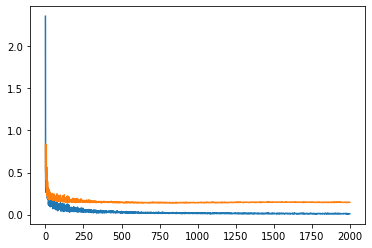

In [82]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [83]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = tcn_both.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [84]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 0.03066110717115216


# Make predictions based on test set and get a root mean squared error 

In [85]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = tcn_both.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [86]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 0.2070144920281491


# Plot train labels along with train predictions

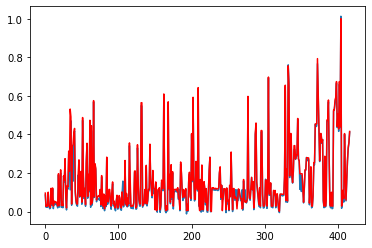

In [87]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

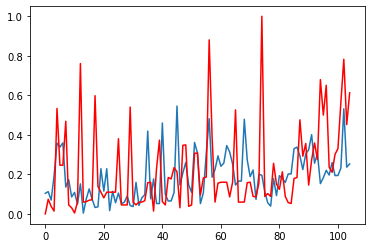

In [88]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

In [89]:
test_yhat[189]

IndexError: index 189 is out of bounds for axis 0 with size 105

# Start of experiment with the addition of historical aadt data

In [4]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_with_Historical_AADT.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [5]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 162):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []
        
        current_row_components_replaced.append(bridge_id)

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Ensure each element in the list of lists is a float

In [6]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [7]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Remove the bridge id's from each time series

In [8]:
for idx, element in enumerate(list_of_row_components):
    list_of_row_components[idx].pop(0)

# View one time series

In [9]:
for i in range(22):
    print(len(list_of_row_components[i]))

15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15


# Get length of list of lists

In [10]:
len(list_of_row_components)

3542

# Convert format of list to have a single time series for each index

In [11]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [12]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [13]:
list_of_examples.shape

(160, 22, 15)

# Perform train test split for dataset

In [14]:
from sklearn.model_selection import train_test_split

n_train_periods = 96
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


In [15]:
train_y = train_y.reshape(96,)
test_y = test_y.reshape(64,)

In [16]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (96, 21, 14)
Shape of train_y: (96,)
Shape of test_X: (64, 21, 14)
Shape of test_y: (64,)


# Build TCN model

In [18]:
from tensorflow.keras.layers import Dense
from tensorflow.keras import Input, Model

from tcn import TCN, tcn_full_summary

batch_size, timesteps, input_dim = None, 21, 14

i = Input(batch_shape=(batch_size, timesteps, input_dim))

o = TCN(return_sequences=False)(i)
o = Dense(1)(o)

tcn_aadt = Model(inputs=[i], outputs=[o])
tcn_aadt.compile(optimizer='adam', loss='mae')

tcn_full_summary(tcn_aadt, expand_residual_blocks=False)

history = tcn_aadt.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Model: "functional_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 21, 14)]          0         
_________________________________________________________________
residual_block_0 (ResidualBl [(None, 21, 64), (None, 2 11072     
_________________________________________________________________
residual_block_1 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_2 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_3 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_4 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_5 (ResidualBl [(None, 21, 64), (None, 2

Epoch 107/2000
3/3 - 0s - loss: 2028.5718 - val_loss: 1368.0787
Epoch 108/2000
3/3 - 0s - loss: 1041.5294 - val_loss: 1730.1564
Epoch 109/2000
3/3 - 0s - loss: 989.4717 - val_loss: 1515.9386
Epoch 110/2000
3/3 - 0s - loss: 1042.8947 - val_loss: 2314.7515
Epoch 111/2000
3/3 - 0s - loss: 1898.1802 - val_loss: 1458.2562
Epoch 112/2000
3/3 - 0s - loss: 1423.7990 - val_loss: 1478.5717
Epoch 113/2000
3/3 - 0s - loss: 848.1626 - val_loss: 1377.1011
Epoch 114/2000
3/3 - 0s - loss: 982.3776 - val_loss: 1889.9058
Epoch 115/2000
3/3 - 0s - loss: 1118.2137 - val_loss: 1595.5176
Epoch 116/2000
3/3 - 0s - loss: 1391.4840 - val_loss: 1858.7625
Epoch 117/2000
3/3 - 0s - loss: 2342.9229 - val_loss: 1333.4126
Epoch 118/2000
3/3 - 0s - loss: 673.9988 - val_loss: 1430.2827
Epoch 119/2000
3/3 - 0s - loss: 765.2350 - val_loss: 1413.8018
Epoch 120/2000
3/3 - 0s - loss: 766.2993 - val_loss: 1546.1484
Epoch 121/2000
3/3 - 0s - loss: 562.8333 - val_loss: 1362.6299
Epoch 122/2000
3/3 - 0s - loss: 575.7631 - val_

Epoch 237/2000
3/3 - 0s - loss: 317.2572 - val_loss: 1131.2041
Epoch 238/2000
3/3 - 0s - loss: 362.2331 - val_loss: 1161.5347
Epoch 239/2000
3/3 - 0s - loss: 284.5676 - val_loss: 1100.8420
Epoch 240/2000
3/3 - 0s - loss: 316.7859 - val_loss: 1118.9736
Epoch 241/2000
3/3 - 0s - loss: 654.1672 - val_loss: 1481.8710
Epoch 242/2000
3/3 - 0s - loss: 701.1656 - val_loss: 1440.8337
Epoch 243/2000
3/3 - 0s - loss: 1346.1931 - val_loss: 1462.1199
Epoch 244/2000
3/3 - 0s - loss: 1132.8121 - val_loss: 1081.5812
Epoch 245/2000
3/3 - 0s - loss: 1005.2645 - val_loss: 1195.7192
Epoch 246/2000
3/3 - 0s - loss: 796.5618 - val_loss: 1173.7802
Epoch 247/2000
3/3 - 0s - loss: 1059.4130 - val_loss: 1179.4556
Epoch 248/2000
3/3 - 0s - loss: 861.1003 - val_loss: 1149.9717
Epoch 249/2000
3/3 - 0s - loss: 905.8001 - val_loss: 1212.2561
Epoch 250/2000
3/3 - 0s - loss: 921.5850 - val_loss: 1168.9233
Epoch 251/2000
3/3 - 0s - loss: 848.4316 - val_loss: 1168.8850
Epoch 252/2000
3/3 - 0s - loss: 723.9053 - val_loss

Epoch 367/2000
3/3 - 0s - loss: 1107.8314 - val_loss: 1049.7450
Epoch 368/2000
3/3 - 0s - loss: 606.5406 - val_loss: 1052.6451
Epoch 369/2000
3/3 - 0s - loss: 573.6291 - val_loss: 1052.1337
Epoch 370/2000
3/3 - 0s - loss: 576.6286 - val_loss: 1062.5712
Epoch 371/2000
3/3 - 0s - loss: 503.7747 - val_loss: 1063.0558
Epoch 372/2000
3/3 - 0s - loss: 525.9600 - val_loss: 1037.3552
Epoch 373/2000
3/3 - 0s - loss: 579.2255 - val_loss: 1031.7040
Epoch 374/2000
3/3 - 0s - loss: 454.8578 - val_loss: 1011.7183
Epoch 375/2000
3/3 - 0s - loss: 235.6899 - val_loss: 1206.0642
Epoch 376/2000
3/3 - 0s - loss: 484.6366 - val_loss: 1201.5231
Epoch 377/2000
3/3 - 0s - loss: 501.8956 - val_loss: 1493.5043
Epoch 378/2000
3/3 - 0s - loss: 784.9453 - val_loss: 1128.2031
Epoch 379/2000
3/3 - 0s - loss: 528.0596 - val_loss: 1375.8032
Epoch 380/2000
3/3 - 0s - loss: 1149.8563 - val_loss: 1120.4421
Epoch 381/2000
3/3 - 0s - loss: 633.4986 - val_loss: 1073.0476
Epoch 382/2000
3/3 - 0s - loss: 440.7751 - val_loss: 

Epoch 498/2000
3/3 - 0s - loss: 204.5437 - val_loss: 952.7102
Epoch 499/2000
3/3 - 0s - loss: 217.0174 - val_loss: 950.6477
Epoch 500/2000
3/3 - 0s - loss: 408.7766 - val_loss: 1325.2871
Epoch 501/2000
3/3 - 0s - loss: 637.4432 - val_loss: 1120.4639
Epoch 502/2000
3/3 - 0s - loss: 726.3985 - val_loss: 1213.0774
Epoch 503/2000
3/3 - 0s - loss: 625.1862 - val_loss: 1082.9761
Epoch 504/2000
3/3 - 0s - loss: 462.0629 - val_loss: 1071.6404
Epoch 505/2000
3/3 - 0s - loss: 453.6499 - val_loss: 1006.6501
Epoch 506/2000
3/3 - 0s - loss: 211.5344 - val_loss: 1146.1614
Epoch 507/2000
3/3 - 0s - loss: 414.0141 - val_loss: 1076.8528
Epoch 508/2000
3/3 - 0s - loss: 286.2327 - val_loss: 1215.2659
Epoch 509/2000
3/3 - 0s - loss: 418.5566 - val_loss: 1042.6794
Epoch 510/2000
3/3 - 0s - loss: 581.0394 - val_loss: 1107.1735
Epoch 511/2000
3/3 - 0s - loss: 645.4673 - val_loss: 991.6105
Epoch 512/2000
3/3 - 0s - loss: 418.3564 - val_loss: 1038.7004
Epoch 513/2000
3/3 - 0s - loss: 435.2589 - val_loss: 998.8

Epoch 630/2000
3/3 - 0s - loss: 513.7464 - val_loss: 902.0008
Epoch 631/2000
3/3 - 0s - loss: 604.2661 - val_loss: 808.1876
Epoch 632/2000
3/3 - 0s - loss: 384.2823 - val_loss: 785.3648
Epoch 633/2000
3/3 - 0s - loss: 385.1488 - val_loss: 781.3348
Epoch 634/2000
3/3 - 0s - loss: 234.8159 - val_loss: 824.2354
Epoch 635/2000
3/3 - 0s - loss: 230.9032 - val_loss: 817.2266
Epoch 636/2000
3/3 - 0s - loss: 378.6799 - val_loss: 968.5612
Epoch 637/2000
3/3 - 0s - loss: 338.0659 - val_loss: 911.9684
Epoch 638/2000
3/3 - 0s - loss: 786.0883 - val_loss: 798.4774
Epoch 639/2000
3/3 - 0s - loss: 611.2982 - val_loss: 869.5906
Epoch 640/2000
3/3 - 0s - loss: 324.3727 - val_loss: 838.8809
Epoch 641/2000
3/3 - 0s - loss: 301.5753 - val_loss: 778.0915
Epoch 642/2000
3/3 - 0s - loss: 168.0465 - val_loss: 829.9504
Epoch 643/2000
3/3 - 0s - loss: 253.8768 - val_loss: 818.7166
Epoch 644/2000
3/3 - 0s - loss: 364.4922 - val_loss: 1005.3200
Epoch 645/2000
3/3 - 0s - loss: 420.2286 - val_loss: 882.1335
Epoch 6

Epoch 762/2000
3/3 - 0s - loss: 311.8981 - val_loss: 662.5457
Epoch 763/2000
3/3 - 0s - loss: 171.0591 - val_loss: 725.2212
Epoch 764/2000
3/3 - 0s - loss: 255.5274 - val_loss: 709.9872
Epoch 765/2000
3/3 - 0s - loss: 338.1809 - val_loss: 928.6328
Epoch 766/2000
3/3 - 0s - loss: 481.4843 - val_loss: 733.1343
Epoch 767/2000
3/3 - 0s - loss: 609.5775 - val_loss: 711.2098
Epoch 768/2000
3/3 - 0s - loss: 225.5692 - val_loss: 701.4568
Epoch 769/2000
3/3 - 0s - loss: 147.8486 - val_loss: 732.3538
Epoch 770/2000
3/3 - 0s - loss: 267.7209 - val_loss: 694.9111
Epoch 771/2000
3/3 - 0s - loss: 119.3678 - val_loss: 694.6609
Epoch 772/2000
3/3 - 0s - loss: 161.2315 - val_loss: 661.3682
Epoch 773/2000
3/3 - 0s - loss: 156.4171 - val_loss: 664.6725
Epoch 774/2000
3/3 - 0s - loss: 146.1127 - val_loss: 681.7231
Epoch 775/2000
3/3 - 0s - loss: 178.8926 - val_loss: 659.2267
Epoch 776/2000
3/3 - 0s - loss: 111.1383 - val_loss: 657.5506
Epoch 777/2000
3/3 - 0s - loss: 157.8379 - val_loss: 664.5797
Epoch 77

Epoch 895/2000
3/3 - 0s - loss: 197.0114 - val_loss: 643.8342
Epoch 896/2000
3/3 - 0s - loss: 382.0770 - val_loss: 775.1536
Epoch 897/2000
3/3 - 0s - loss: 275.0697 - val_loss: 749.9493
Epoch 898/2000
3/3 - 0s - loss: 494.6435 - val_loss: 793.6730
Epoch 899/2000
3/3 - 0s - loss: 517.5900 - val_loss: 747.6835
Epoch 900/2000
3/3 - 0s - loss: 284.7635 - val_loss: 727.4519
Epoch 901/2000
3/3 - 0s - loss: 235.9609 - val_loss: 660.3340
Epoch 902/2000
3/3 - 0s - loss: 235.7535 - val_loss: 623.6249
Epoch 903/2000
3/3 - 0s - loss: 181.7778 - val_loss: 622.1535
Epoch 904/2000
3/3 - 0s - loss: 281.2799 - val_loss: 658.3939
Epoch 905/2000
3/3 - 0s - loss: 255.4987 - val_loss: 703.1537
Epoch 906/2000
3/3 - 0s - loss: 352.5752 - val_loss: 742.2755
Epoch 907/2000
3/3 - 0s - loss: 365.2116 - val_loss: 697.5069
Epoch 908/2000
3/3 - 0s - loss: 575.5041 - val_loss: 604.0732
Epoch 909/2000
3/3 - 0s - loss: 476.0916 - val_loss: 677.2059
Epoch 910/2000
3/3 - 0s - loss: 372.8684 - val_loss: 659.1610
Epoch 91

Epoch 1027/2000
3/3 - 0s - loss: 175.2688 - val_loss: 605.1906
Epoch 1028/2000
3/3 - 0s - loss: 222.2620 - val_loss: 618.5823
Epoch 1029/2000
3/3 - 0s - loss: 257.8864 - val_loss: 626.6634
Epoch 1030/2000
3/3 - 0s - loss: 166.7721 - val_loss: 601.7469
Epoch 1031/2000
3/3 - 0s - loss: 250.5473 - val_loss: 625.4950
Epoch 1032/2000
3/3 - 0s - loss: 136.5114 - val_loss: 631.2568
Epoch 1033/2000
3/3 - 0s - loss: 157.9730 - val_loss: 616.9396
Epoch 1034/2000
3/3 - 0s - loss: 183.1225 - val_loss: 693.6177
Epoch 1035/2000
3/3 - 0s - loss: 303.4895 - val_loss: 723.4818
Epoch 1036/2000
3/3 - 0s - loss: 303.6902 - val_loss: 729.7427
Epoch 1037/2000
3/3 - 0s - loss: 335.5811 - val_loss: 675.1799
Epoch 1038/2000
3/3 - 0s - loss: 242.5301 - val_loss: 684.2427
Epoch 1039/2000
3/3 - 0s - loss: 276.7199 - val_loss: 782.1610
Epoch 1040/2000
3/3 - 0s - loss: 350.1508 - val_loss: 790.7655
Epoch 1041/2000
3/3 - 0s - loss: 541.3486 - val_loss: 635.8636
Epoch 1042/2000
3/3 - 0s - loss: 352.2234 - val_loss: 6

Epoch 1158/2000
3/3 - 0s - loss: 637.3127 - val_loss: 642.9784
Epoch 1159/2000
3/3 - 0s - loss: 242.1282 - val_loss: 561.4723
Epoch 1160/2000
3/3 - 0s - loss: 159.4369 - val_loss: 546.9325
Epoch 1161/2000
3/3 - 0s - loss: 84.4572 - val_loss: 562.2693
Epoch 1162/2000
3/3 - 0s - loss: 110.4654 - val_loss: 616.0923
Epoch 1163/2000
3/3 - 0s - loss: 231.8390 - val_loss: 569.4442
Epoch 1164/2000
3/3 - 0s - loss: 84.6321 - val_loss: 553.7054
Epoch 1165/2000
3/3 - 0s - loss: 107.2931 - val_loss: 605.3213
Epoch 1166/2000
3/3 - 0s - loss: 97.0329 - val_loss: 547.3675
Epoch 1167/2000
3/3 - 0s - loss: 154.1752 - val_loss: 541.2373
Epoch 1168/2000
3/3 - 0s - loss: 69.8718 - val_loss: 551.8296
Epoch 1169/2000
3/3 - 0s - loss: 126.3918 - val_loss: 589.2936
Epoch 1170/2000
3/3 - 0s - loss: 169.8880 - val_loss: 626.8996
Epoch 1171/2000
3/3 - 0s - loss: 247.8223 - val_loss: 695.4825
Epoch 1172/2000
3/3 - 0s - loss: 390.2258 - val_loss: 610.3766
Epoch 1173/2000
3/3 - 0s - loss: 432.4271 - val_loss: 517.5

Epoch 1289/2000
3/3 - 0s - loss: 104.0248 - val_loss: 582.5424
Epoch 1290/2000
3/3 - 0s - loss: 165.9610 - val_loss: 740.3680
Epoch 1291/2000
3/3 - 0s - loss: 258.0859 - val_loss: 642.5348
Epoch 1292/2000
3/3 - 0s - loss: 186.5443 - val_loss: 742.8481
Epoch 1293/2000
3/3 - 0s - loss: 307.7473 - val_loss: 630.9050
Epoch 1294/2000
3/3 - 0s - loss: 233.3006 - val_loss: 632.9274
Epoch 1295/2000
3/3 - 0s - loss: 284.4843 - val_loss: 596.2267
Epoch 1296/2000
3/3 - 0s - loss: 202.3741 - val_loss: 630.7269
Epoch 1297/2000
3/3 - 0s - loss: 266.0828 - val_loss: 593.5839
Epoch 1298/2000
3/3 - 0s - loss: 237.3903 - val_loss: 632.3134
Epoch 1299/2000
3/3 - 0s - loss: 229.1976 - val_loss: 607.2909
Epoch 1300/2000
3/3 - 0s - loss: 262.3919 - val_loss: 607.5235
Epoch 1301/2000
3/3 - 0s - loss: 183.0535 - val_loss: 581.4050
Epoch 1302/2000
3/3 - 0s - loss: 243.8456 - val_loss: 653.5369
Epoch 1303/2000
3/3 - 0s - loss: 239.2343 - val_loss: 566.6639
Epoch 1304/2000
3/3 - 0s - loss: 255.3939 - val_loss: 6

Epoch 1420/2000
3/3 - 0s - loss: 193.3915 - val_loss: 556.0295
Epoch 1421/2000
3/3 - 0s - loss: 265.2479 - val_loss: 491.3249
Epoch 1422/2000
3/3 - 0s - loss: 215.4675 - val_loss: 527.5963
Epoch 1423/2000
3/3 - 0s - loss: 194.9753 - val_loss: 498.9402
Epoch 1424/2000
3/3 - 0s - loss: 306.9501 - val_loss: 461.8449
Epoch 1425/2000
3/3 - 0s - loss: 143.9400 - val_loss: 491.6487
Epoch 1426/2000
3/3 - 0s - loss: 287.5608 - val_loss: 473.5207
Epoch 1427/2000
3/3 - 0s - loss: 154.6445 - val_loss: 484.1965
Epoch 1428/2000
3/3 - 0s - loss: 256.4543 - val_loss: 500.2442
Epoch 1429/2000
3/3 - 0s - loss: 267.7914 - val_loss: 441.2432
Epoch 1430/2000
3/3 - 0s - loss: 137.9839 - val_loss: 481.6178
Epoch 1431/2000
3/3 - 0s - loss: 164.8977 - val_loss: 479.2134
Epoch 1432/2000
3/3 - 0s - loss: 230.2250 - val_loss: 508.0636
Epoch 1433/2000
3/3 - 0s - loss: 353.0361 - val_loss: 409.5715
Epoch 1434/2000
3/3 - 0s - loss: 159.8768 - val_loss: 404.0983
Epoch 1435/2000
3/3 - 0s - loss: 182.6527 - val_loss: 4

Epoch 1551/2000
3/3 - 0s - loss: 125.7855 - val_loss: 500.4133
Epoch 1552/2000
3/3 - 0s - loss: 129.4598 - val_loss: 395.4410
Epoch 1553/2000
3/3 - 0s - loss: 72.3021 - val_loss: 487.2638
Epoch 1554/2000
3/3 - 0s - loss: 109.1205 - val_loss: 401.9168
Epoch 1555/2000
3/3 - 0s - loss: 89.5979 - val_loss: 395.1600
Epoch 1556/2000
3/3 - 0s - loss: 67.4828 - val_loss: 441.0556
Epoch 1557/2000
3/3 - 0s - loss: 97.2871 - val_loss: 429.1167
Epoch 1558/2000
3/3 - 0s - loss: 126.1867 - val_loss: 394.0003
Epoch 1559/2000
3/3 - 0s - loss: 190.3655 - val_loss: 514.7915
Epoch 1560/2000
3/3 - 0s - loss: 189.0910 - val_loss: 454.9712
Epoch 1561/2000
3/3 - 0s - loss: 219.7776 - val_loss: 437.4575
Epoch 1562/2000
3/3 - 0s - loss: 133.5140 - val_loss: 456.5396
Epoch 1563/2000
3/3 - 0s - loss: 219.0743 - val_loss: 501.5871
Epoch 1564/2000
3/3 - 0s - loss: 215.9777 - val_loss: 460.6279
Epoch 1565/2000
3/3 - 0s - loss: 306.3861 - val_loss: 428.4288
Epoch 1566/2000
3/3 - 0s - loss: 212.4977 - val_loss: 406.2

Epoch 1682/2000
3/3 - 0s - loss: 98.7255 - val_loss: 388.2697
Epoch 1683/2000
3/3 - 0s - loss: 131.6208 - val_loss: 483.1869
Epoch 1684/2000
3/3 - 0s - loss: 200.8238 - val_loss: 425.5894
Epoch 1685/2000
3/3 - 0s - loss: 197.0306 - val_loss: 442.4355
Epoch 1686/2000
3/3 - 0s - loss: 259.6868 - val_loss: 398.9944
Epoch 1687/2000
3/3 - 0s - loss: 152.6703 - val_loss: 402.7107
Epoch 1688/2000
3/3 - 0s - loss: 137.4061 - val_loss: 382.9915
Epoch 1689/2000
3/3 - 0s - loss: 125.8218 - val_loss: 413.7124
Epoch 1690/2000
3/3 - 0s - loss: 81.0298 - val_loss: 356.5352
Epoch 1691/2000
3/3 - 0s - loss: 137.9327 - val_loss: 531.9933
Epoch 1692/2000
3/3 - 0s - loss: 205.2592 - val_loss: 436.1506
Epoch 1693/2000
3/3 - 0s - loss: 226.9951 - val_loss: 477.8157
Epoch 1694/2000
3/3 - 0s - loss: 268.0656 - val_loss: 390.3756
Epoch 1695/2000
3/3 - 0s - loss: 159.7314 - val_loss: 424.1019
Epoch 1696/2000
3/3 - 0s - loss: 94.8140 - val_loss: 386.3733
Epoch 1697/2000
3/3 - 0s - loss: 213.9802 - val_loss: 466.

Epoch 1813/2000
3/3 - 0s - loss: 85.9180 - val_loss: 425.2358
Epoch 1814/2000
3/3 - 0s - loss: 103.1526 - val_loss: 410.9843
Epoch 1815/2000
3/3 - 0s - loss: 106.9282 - val_loss: 436.7049
Epoch 1816/2000
3/3 - 0s - loss: 111.8436 - val_loss: 442.4049
Epoch 1817/2000
3/3 - 0s - loss: 78.2237 - val_loss: 403.0143
Epoch 1818/2000
3/3 - 0s - loss: 96.0762 - val_loss: 384.7274
Epoch 1819/2000
3/3 - 0s - loss: 68.7979 - val_loss: 411.2656
Epoch 1820/2000
3/3 - 0s - loss: 78.6305 - val_loss: 362.8559
Epoch 1821/2000
3/3 - 0s - loss: 79.8100 - val_loss: 388.5469
Epoch 1822/2000
3/3 - 0s - loss: 78.0746 - val_loss: 368.4482
Epoch 1823/2000
3/3 - 0s - loss: 107.8959 - val_loss: 373.2929
Epoch 1824/2000
3/3 - 0s - loss: 83.0369 - val_loss: 368.8726
Epoch 1825/2000
3/3 - 0s - loss: 58.0564 - val_loss: 374.9966
Epoch 1826/2000
3/3 - 0s - loss: 142.2396 - val_loss: 368.6720
Epoch 1827/2000
3/3 - 0s - loss: 95.1625 - val_loss: 359.7906
Epoch 1828/2000
3/3 - 0s - loss: 106.7979 - val_loss: 381.3621
Ep

Epoch 1944/2000
3/3 - 0s - loss: 131.4392 - val_loss: 360.8980
Epoch 1945/2000
3/3 - 0s - loss: 124.9666 - val_loss: 412.7479
Epoch 1946/2000
3/3 - 0s - loss: 157.2613 - val_loss: 365.5353
Epoch 1947/2000
3/3 - 0s - loss: 147.4188 - val_loss: 379.6097
Epoch 1948/2000
3/3 - 0s - loss: 130.5425 - val_loss: 394.7861
Epoch 1949/2000
3/3 - 0s - loss: 165.9922 - val_loss: 376.7240
Epoch 1950/2000
3/3 - 0s - loss: 142.0962 - val_loss: 392.3702
Epoch 1951/2000
3/3 - 0s - loss: 297.3552 - val_loss: 327.4678
Epoch 1952/2000
3/3 - 0s - loss: 173.0755 - val_loss: 380.0999
Epoch 1953/2000
3/3 - 0s - loss: 107.3033 - val_loss: 347.6918
Epoch 1954/2000
3/3 - 0s - loss: 83.0722 - val_loss: 336.8617
Epoch 1955/2000
3/3 - 0s - loss: 92.0434 - val_loss: 345.2737
Epoch 1956/2000
3/3 - 0s - loss: 108.6600 - val_loss: 378.2587
Epoch 1957/2000
3/3 - 0s - loss: 155.2063 - val_loss: 372.2507
Epoch 1958/2000
3/3 - 0s - loss: 123.1491 - val_loss: 365.3859
Epoch 1959/2000
3/3 - 0s - loss: 191.6479 - val_loss: 368

# Plot model loss and validation loss

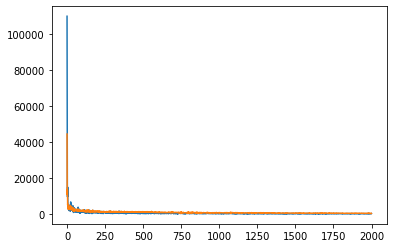

In [22]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [23]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = tcn_aadt.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [24]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 90.42961652344842


# Make predictions based on test set and get a root mean squared error 

In [25]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = tcn_aadt.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [26]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 940.0712602945047


# Plot train labels along with train predictions

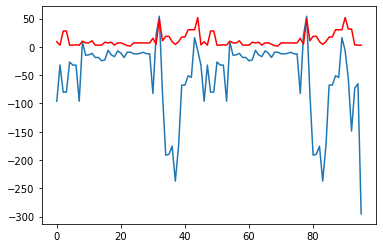

In [27]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

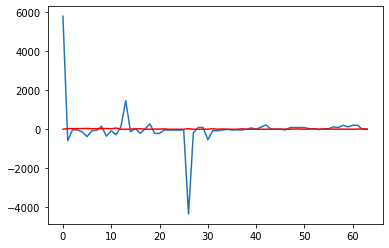

In [28]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()

# Start of experiment with both the addition of historical aadt data and normalization

In [29]:
from pandas import read_csv

df = read_csv('Time_Series_For_Clustering_El_Paso_with_Historical_AADT.csv')

# get each separate time series as an individual list and append each of these lists to a master list

In [30]:
import re
import pandas as pd

non_decimal = re.compile(r'[^\d.]+')

list_of_training_df = []
list_of_row_components = []

for i in range(1, 162):
    
    current_row = df.iloc[i]
    
    bridge_id = current_row.iloc[0]
    
    current_row = current_row.iloc[1:]
    
    for j, row in current_row.iteritems():
        
        current_row_components = row.split(', ')
        current_row_components_replaced = []
        
        current_row_components_replaced.append(bridge_id)

        for idx, component in enumerate(current_row_components):

            result = non_decimal.sub('', current_row_components[idx])
            current_row_components_replaced.append(float(result))

        list_of_row_components.append(current_row_components_replaced)

# Ensure each element in the list of lists is a float

In [31]:
for idx, element in enumerate(list_of_row_components):
    for i in range(1, len(element)):
        list_of_row_components[idx][i] = float(list_of_row_components[idx][i])

# Swap last entry with second entry in time series to make the output predictor variable Sufficiency Rating

In [32]:
for idx, component in enumerate(list_of_row_components):
    temp = component[6]
    list_of_row_components[idx][6] = list_of_row_components[idx][1]
    list_of_row_components[idx][1] = temp

# Remove the bridge id's from each time series

In [33]:
for idx, element in enumerate(list_of_row_components):
    list_of_row_components[idx].pop(0)

# View one time series

In [34]:
for i in range(22):
    print(len(list_of_row_components[i]))

15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15
15


# Get length of list of lists

In [35]:
len(list_of_row_components)

3542

# Convert format of list to have a sinlge time series for each index

In [36]:
import numpy as np

list_of_examples = []
temp_list = []

max_num = 22
iter = 0;

for row_component in list_of_row_components:
    if iter == max_num:
        list_of_examples.append(np.array(temp_list))
        temp_list = []
        iter = 0
        
    temp_list.append(np.array(row_component))
    iter += 1

list_of_examples = np.array(list_of_examples)

# Make the very last time step of each time series just a single value (Sufficiency Rating) for the model to predict on

In [37]:
for idx, example in enumerate(list_of_examples):
    list_of_examples[idx][21] = [list_of_examples[idx][21][6]]

In [38]:
list_of_examples.shape

(160, 22, 15)

# Perform train test split for dataset

In [39]:
from sklearn.model_selection import train_test_split

n_train_periods = 96
train = list_of_examples[:n_train_periods, :]
test = list_of_examples[n_train_periods:, :]

# split into input and outputs
train_X, train_y = train[:, :-1, 1:], train[:, -1, 0]
test_X, test_y = test[:, :-1, 1:], test[:, -1, 0]


# Apply MinMaxScaler on data

In [40]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

for idx, x in enumerate(train_X):
    train_X[idx] = scaler.fit_transform(x)

train_y = scaler.fit_transform(train_y.reshape(-1,1))

for idx, x in enumerate(test_X):
    test_X[idx] = scaler.fit_transform(x)

test_y = scaler.fit_transform(test_y.reshape(-1,1))

In [41]:
train_y = train_y.reshape(96,)
test_y = test_y.reshape(64,)

In [42]:
print("Shape of train_X: " + str(train_X.shape))
print("Shape of train_y: " + str(train_y.shape))
print("Shape of test_X: " + str(test_X.shape))
print("Shape of test_y: " + str(test_y.shape))

Shape of train_X: (96, 21, 14)
Shape of train_y: (96,)
Shape of test_X: (64, 21, 14)
Shape of test_y: (64,)


# Build TCN model

In [43]:
from tensorflow.keras.layers import Dense
from tensorflow.keras import Input, Model

from tcn import TCN, tcn_full_summary

batch_size, timesteps, input_dim = None, 21, 14

i = Input(batch_shape=(batch_size, timesteps, input_dim))

o = TCN(return_sequences=False)(i)
o = Dense(1)(o)

tcn_aadt_norm = Model(inputs=[i], outputs=[o])
tcn_aadt_norm.compile(optimizer='adam', loss='mae')

tcn_full_summary(tcn_aadt_norm, expand_residual_blocks=False)

history = tcn_aadt_norm.fit(train_X, train_y, epochs=2000, batch_size=32, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Model: "functional_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 21, 14)]          0         
_________________________________________________________________
residual_block_0 (ResidualBl [(None, 21, 64), (None, 2 11072     
_________________________________________________________________
residual_block_1 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_2 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_3 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_4 (ResidualBl [(None, 21, 64), (None, 2 16512     
_________________________________________________________________
residual_block_5 (ResidualBl [(None, 21, 64), (None, 2

Epoch 118/2000
3/3 - 0s - loss: 0.0632 - val_loss: 0.2774
Epoch 119/2000
3/3 - 0s - loss: 0.0527 - val_loss: 0.2910
Epoch 120/2000
3/3 - 0s - loss: 0.0479 - val_loss: 0.3101
Epoch 121/2000
3/3 - 0s - loss: 0.0647 - val_loss: 0.2839
Epoch 122/2000
3/3 - 0s - loss: 0.0562 - val_loss: 0.2864
Epoch 123/2000
3/3 - 0s - loss: 0.0497 - val_loss: 0.3102
Epoch 124/2000
3/3 - 0s - loss: 0.0691 - val_loss: 0.2836
Epoch 125/2000
3/3 - 0s - loss: 0.0738 - val_loss: 0.2881
Epoch 126/2000
3/3 - 0s - loss: 0.0388 - val_loss: 0.2930
Epoch 127/2000
3/3 - 0s - loss: 0.0361 - val_loss: 0.2986
Epoch 128/2000
3/3 - 0s - loss: 0.0445 - val_loss: 0.2832
Epoch 129/2000
3/3 - 0s - loss: 0.0645 - val_loss: 0.2776
Epoch 130/2000
3/3 - 0s - loss: 0.0528 - val_loss: 0.2867
Epoch 131/2000
3/3 - 0s - loss: 0.0599 - val_loss: 0.2950
Epoch 132/2000
3/3 - 0s - loss: 0.0535 - val_loss: 0.2901
Epoch 133/2000
3/3 - 0s - loss: 0.0631 - val_loss: 0.2727
Epoch 134/2000
3/3 - 0s - loss: 0.0703 - val_loss: 0.2833
Epoch 135/2000

Epoch 260/2000
3/3 - 0s - loss: 0.0353 - val_loss: 0.2383
Epoch 261/2000
3/3 - 0s - loss: 0.0397 - val_loss: 0.2479
Epoch 262/2000
3/3 - 0s - loss: 0.0477 - val_loss: 0.2616
Epoch 263/2000
3/3 - 0s - loss: 0.0446 - val_loss: 0.2384
Epoch 264/2000
3/3 - 0s - loss: 0.0492 - val_loss: 0.2374
Epoch 265/2000
3/3 - 0s - loss: 0.0312 - val_loss: 0.2438
Epoch 266/2000
3/3 - 0s - loss: 0.0243 - val_loss: 0.2462
Epoch 267/2000
3/3 - 0s - loss: 0.0302 - val_loss: 0.2350
Epoch 268/2000
3/3 - 0s - loss: 0.0452 - val_loss: 0.2424
Epoch 269/2000
3/3 - 0s - loss: 0.0393 - val_loss: 0.2468
Epoch 270/2000
3/3 - 0s - loss: 0.0434 - val_loss: 0.2336
Epoch 271/2000
3/3 - 0s - loss: 0.0339 - val_loss: 0.2430
Epoch 272/2000
3/3 - 0s - loss: 0.0255 - val_loss: 0.2541
Epoch 273/2000
3/3 - 0s - loss: 0.0422 - val_loss: 0.2377
Epoch 274/2000
3/3 - 0s - loss: 0.0522 - val_loss: 0.2415
Epoch 275/2000
3/3 - 0s - loss: 0.0421 - val_loss: 0.2451
Epoch 276/2000
3/3 - 0s - loss: 0.0319 - val_loss: 0.2325
Epoch 277/2000

Epoch 402/2000
3/3 - 0s - loss: 0.0205 - val_loss: 0.2224
Epoch 403/2000
3/3 - 0s - loss: 0.0347 - val_loss: 0.2144
Epoch 404/2000
3/3 - 0s - loss: 0.0295 - val_loss: 0.2142
Epoch 405/2000
3/3 - 0s - loss: 0.0334 - val_loss: 0.2184
Epoch 406/2000
3/3 - 0s - loss: 0.0337 - val_loss: 0.2215
Epoch 407/2000
3/3 - 0s - loss: 0.0297 - val_loss: 0.2093
Epoch 408/2000
3/3 - 0s - loss: 0.0349 - val_loss: 0.2160
Epoch 409/2000
3/3 - 0s - loss: 0.0281 - val_loss: 0.2172
Epoch 410/2000
3/3 - 0s - loss: 0.0237 - val_loss: 0.2129
Epoch 411/2000
3/3 - 0s - loss: 0.0192 - val_loss: 0.2102
Epoch 412/2000
3/3 - 0s - loss: 0.0256 - val_loss: 0.2127
Epoch 413/2000
3/3 - 0s - loss: 0.0308 - val_loss: 0.2150
Epoch 414/2000
3/3 - 0s - loss: 0.0241 - val_loss: 0.2074
Epoch 415/2000
3/3 - 0s - loss: 0.0378 - val_loss: 0.2109
Epoch 416/2000
3/3 - 0s - loss: 0.0265 - val_loss: 0.2174
Epoch 417/2000
3/3 - 0s - loss: 0.0267 - val_loss: 0.2113
Epoch 418/2000
3/3 - 0s - loss: 0.0238 - val_loss: 0.2101
Epoch 419/2000

Epoch 544/2000
3/3 - 0s - loss: 0.0199 - val_loss: 0.1921
Epoch 545/2000
3/3 - 0s - loss: 0.0143 - val_loss: 0.1933
Epoch 546/2000
3/3 - 0s - loss: 0.0156 - val_loss: 0.1948
Epoch 547/2000
3/3 - 0s - loss: 0.0179 - val_loss: 0.1853
Epoch 548/2000
3/3 - 0s - loss: 0.0339 - val_loss: 0.2078
Epoch 549/2000
3/3 - 0s - loss: 0.0293 - val_loss: 0.1865
Epoch 550/2000
3/3 - 0s - loss: 0.0187 - val_loss: 0.1886
Epoch 551/2000
3/3 - 0s - loss: 0.0177 - val_loss: 0.1918
Epoch 552/2000
3/3 - 0s - loss: 0.0146 - val_loss: 0.1942
Epoch 553/2000
3/3 - 0s - loss: 0.0223 - val_loss: 0.1856
Epoch 554/2000
3/3 - 0s - loss: 0.0364 - val_loss: 0.1956
Epoch 555/2000
3/3 - 0s - loss: 0.0271 - val_loss: 0.1916
Epoch 556/2000
3/3 - 0s - loss: 0.0193 - val_loss: 0.1834
Epoch 557/2000
3/3 - 0s - loss: 0.0180 - val_loss: 0.1965
Epoch 558/2000
3/3 - 0s - loss: 0.0261 - val_loss: 0.1832
Epoch 559/2000
3/3 - 0s - loss: 0.0281 - val_loss: 0.1860
Epoch 560/2000
3/3 - 0s - loss: 0.0169 - val_loss: 0.1881
Epoch 561/2000

3/3 - 0s - loss: 0.0189 - val_loss: 0.1951
Epoch 686/2000
3/3 - 0s - loss: 0.0280 - val_loss: 0.1947
Epoch 687/2000
3/3 - 0s - loss: 0.0183 - val_loss: 0.1897
Epoch 688/2000
3/3 - 0s - loss: 0.0152 - val_loss: 0.1894
Epoch 689/2000
3/3 - 0s - loss: 0.0096 - val_loss: 0.1906
Epoch 690/2000
3/3 - 0s - loss: 0.0102 - val_loss: 0.1931
Epoch 691/2000
3/3 - 0s - loss: 0.0103 - val_loss: 0.1904
Epoch 692/2000
3/3 - 0s - loss: 0.0101 - val_loss: 0.1910
Epoch 693/2000
3/3 - 0s - loss: 0.0093 - val_loss: 0.1907
Epoch 694/2000
3/3 - 0s - loss: 0.0153 - val_loss: 0.2015
Epoch 695/2000
3/3 - 0s - loss: 0.0270 - val_loss: 0.1818
Epoch 696/2000
3/3 - 0s - loss: 0.0193 - val_loss: 0.1923
Epoch 697/2000
3/3 - 0s - loss: 0.0153 - val_loss: 0.1991
Epoch 698/2000
3/3 - 0s - loss: 0.0195 - val_loss: 0.1837
Epoch 699/2000
3/3 - 0s - loss: 0.0215 - val_loss: 0.1856
Epoch 700/2000
3/3 - 0s - loss: 0.0146 - val_loss: 0.1891
Epoch 701/2000
3/3 - 0s - loss: 0.0174 - val_loss: 0.1972
Epoch 702/2000
3/3 - 0s - los

Epoch 827/2000
3/3 - 0s - loss: 0.0203 - val_loss: 0.1971
Epoch 828/2000
3/3 - 0s - loss: 0.0229 - val_loss: 0.1855
Epoch 829/2000
3/3 - 0s - loss: 0.0095 - val_loss: 0.1874
Epoch 830/2000
3/3 - 0s - loss: 0.0129 - val_loss: 0.1776
Epoch 831/2000
3/3 - 0s - loss: 0.0231 - val_loss: 0.1986
Epoch 832/2000
3/3 - 0s - loss: 0.0226 - val_loss: 0.1834
Epoch 833/2000
3/3 - 0s - loss: 0.0152 - val_loss: 0.1871
Epoch 834/2000
3/3 - 0s - loss: 0.0118 - val_loss: 0.1841
Epoch 835/2000
3/3 - 0s - loss: 0.0145 - val_loss: 0.1873
Epoch 836/2000
3/3 - 0s - loss: 0.0154 - val_loss: 0.1950
Epoch 837/2000
3/3 - 0s - loss: 0.0192 - val_loss: 0.1818
Epoch 838/2000
3/3 - 0s - loss: 0.0222 - val_loss: 0.1946
Epoch 839/2000
3/3 - 0s - loss: 0.0127 - val_loss: 0.1903
Epoch 840/2000
3/3 - 0s - loss: 0.0111 - val_loss: 0.1879
Epoch 841/2000
3/3 - 0s - loss: 0.0126 - val_loss: 0.1846
Epoch 842/2000
3/3 - 0s - loss: 0.0158 - val_loss: 0.1786
Epoch 843/2000
3/3 - 0s - loss: 0.0232 - val_loss: 0.1963
Epoch 844/2000

Epoch 969/2000
3/3 - 0s - loss: 0.0175 - val_loss: 0.1911
Epoch 970/2000
3/3 - 0s - loss: 0.0122 - val_loss: 0.1896
Epoch 971/2000
3/3 - 0s - loss: 0.0107 - val_loss: 0.1848
Epoch 972/2000
3/3 - 0s - loss: 0.0147 - val_loss: 0.1769
Epoch 973/2000
3/3 - 0s - loss: 0.0180 - val_loss: 0.1959
Epoch 974/2000
3/3 - 0s - loss: 0.0238 - val_loss: 0.1769
Epoch 975/2000
3/3 - 0s - loss: 0.0140 - val_loss: 0.1874
Epoch 976/2000
3/3 - 0s - loss: 0.0131 - val_loss: 0.1876
Epoch 977/2000
3/3 - 0s - loss: 0.0126 - val_loss: 0.1795
Epoch 978/2000
3/3 - 0s - loss: 0.0154 - val_loss: 0.1890
Epoch 979/2000
3/3 - 0s - loss: 0.0187 - val_loss: 0.1871
Epoch 980/2000
3/3 - 0s - loss: 0.0084 - val_loss: 0.1818
Epoch 981/2000
3/3 - 0s - loss: 0.0095 - val_loss: 0.1790
Epoch 982/2000
3/3 - 0s - loss: 0.0125 - val_loss: 0.1853
Epoch 983/2000
3/3 - 0s - loss: 0.0176 - val_loss: 0.1886
Epoch 984/2000
3/3 - 0s - loss: 0.0127 - val_loss: 0.1807
Epoch 985/2000
3/3 - 0s - loss: 0.0153 - val_loss: 0.1819
Epoch 986/2000

Epoch 1109/2000
3/3 - 0s - loss: 0.0123 - val_loss: 0.1708
Epoch 1110/2000
3/3 - 0s - loss: 0.0205 - val_loss: 0.1799
Epoch 1111/2000
3/3 - 0s - loss: 0.0108 - val_loss: 0.1783
Epoch 1112/2000
3/3 - 0s - loss: 0.0101 - val_loss: 0.1771
Epoch 1113/2000
3/3 - 0s - loss: 0.0107 - val_loss: 0.1706
Epoch 1114/2000
3/3 - 0s - loss: 0.0115 - val_loss: 0.1724
Epoch 1115/2000
3/3 - 0s - loss: 0.0136 - val_loss: 0.1806
Epoch 1116/2000
3/3 - 0s - loss: 0.0161 - val_loss: 0.1752
Epoch 1117/2000
3/3 - 0s - loss: 0.0168 - val_loss: 0.1693
Epoch 1118/2000
3/3 - 0s - loss: 0.0163 - val_loss: 0.1796
Epoch 1119/2000
3/3 - 0s - loss: 0.0107 - val_loss: 0.1732
Epoch 1120/2000
3/3 - 0s - loss: 0.0075 - val_loss: 0.1690
Epoch 1121/2000
3/3 - 0s - loss: 0.0140 - val_loss: 0.1783
Epoch 1122/2000
3/3 - 0s - loss: 0.0158 - val_loss: 0.1741
Epoch 1123/2000
3/3 - 0s - loss: 0.0131 - val_loss: 0.1688
Epoch 1124/2000
3/3 - 0s - loss: 0.0126 - val_loss: 0.1718
Epoch 1125/2000
3/3 - 0s - loss: 0.0121 - val_loss: 0.18

Epoch 1248/2000
3/3 - 0s - loss: 0.0123 - val_loss: 0.1801
Epoch 1249/2000
3/3 - 0s - loss: 0.0140 - val_loss: 0.1877
Epoch 1250/2000
3/3 - 0s - loss: 0.0173 - val_loss: 0.1826
Epoch 1251/2000
3/3 - 0s - loss: 0.0095 - val_loss: 0.1810
Epoch 1252/2000
3/3 - 0s - loss: 0.0089 - val_loss: 0.1789
Epoch 1253/2000
3/3 - 0s - loss: 0.0087 - val_loss: 0.1824
Epoch 1254/2000
3/3 - 0s - loss: 0.0115 - val_loss: 0.1910
Epoch 1255/2000
3/3 - 0s - loss: 0.0149 - val_loss: 0.1780
Epoch 1256/2000
3/3 - 0s - loss: 0.0191 - val_loss: 0.1883
Epoch 1257/2000
3/3 - 0s - loss: 0.0121 - val_loss: 0.1856
Epoch 1258/2000
3/3 - 0s - loss: 0.0109 - val_loss: 0.1803
Epoch 1259/2000
3/3 - 0s - loss: 0.0096 - val_loss: 0.1765
Epoch 1260/2000
3/3 - 0s - loss: 0.0155 - val_loss: 0.1896
Epoch 1261/2000
3/3 - 0s - loss: 0.0178 - val_loss: 0.1742
Epoch 1262/2000
3/3 - 0s - loss: 0.0147 - val_loss: 0.1832
Epoch 1263/2000
3/3 - 0s - loss: 0.0130 - val_loss: 0.1897
Epoch 1264/2000
3/3 - 0s - loss: 0.0121 - val_loss: 0.17

Epoch 1387/2000
3/3 - 0s - loss: 0.0070 - val_loss: 0.1768
Epoch 1388/2000
3/3 - 0s - loss: 0.0082 - val_loss: 0.1779
Epoch 1389/2000
3/3 - 0s - loss: 0.0085 - val_loss: 0.1838
Epoch 1390/2000
3/3 - 0s - loss: 0.0165 - val_loss: 0.1775
Epoch 1391/2000
3/3 - 0s - loss: 0.0130 - val_loss: 0.1761
Epoch 1392/2000
3/3 - 0s - loss: 0.0092 - val_loss: 0.1825
Epoch 1393/2000
3/3 - 0s - loss: 0.0092 - val_loss: 0.1812
Epoch 1394/2000
3/3 - 0s - loss: 0.0082 - val_loss: 0.1744
Epoch 1395/2000
3/3 - 0s - loss: 0.0177 - val_loss: 0.1859
Epoch 1396/2000
3/3 - 0s - loss: 0.0122 - val_loss: 0.1798
Epoch 1397/2000
3/3 - 0s - loss: 0.0092 - val_loss: 0.1757
Epoch 1398/2000
3/3 - 0s - loss: 0.0090 - val_loss: 0.1796
Epoch 1399/2000
3/3 - 0s - loss: 0.0118 - val_loss: 0.1844
Epoch 1400/2000
3/3 - 0s - loss: 0.0141 - val_loss: 0.1746
Epoch 1401/2000
3/3 - 0s - loss: 0.0129 - val_loss: 0.1776
Epoch 1402/2000
3/3 - 0s - loss: 0.0085 - val_loss: 0.1824
Epoch 1403/2000
3/3 - 0s - loss: 0.0077 - val_loss: 0.18

Epoch 1526/2000
3/3 - 0s - loss: 0.0143 - val_loss: 0.1826
Epoch 1527/2000
3/3 - 0s - loss: 0.0069 - val_loss: 0.1828
Epoch 1528/2000
3/3 - 0s - loss: 0.0105 - val_loss: 0.1831
Epoch 1529/2000
3/3 - 0s - loss: 0.0105 - val_loss: 0.1797
Epoch 1530/2000
3/3 - 0s - loss: 0.0134 - val_loss: 0.1842
Epoch 1531/2000
3/3 - 0s - loss: 0.0092 - val_loss: 0.1816
Epoch 1532/2000
3/3 - 0s - loss: 0.0083 - val_loss: 0.1865
Epoch 1533/2000
3/3 - 0s - loss: 0.0156 - val_loss: 0.1733
Epoch 1534/2000
3/3 - 0s - loss: 0.0154 - val_loss: 0.1864
Epoch 1535/2000
3/3 - 0s - loss: 0.0112 - val_loss: 0.1807
Epoch 1536/2000
3/3 - 0s - loss: 0.0099 - val_loss: 0.1759
Epoch 1537/2000
3/3 - 0s - loss: 0.0131 - val_loss: 0.1890
Epoch 1538/2000
3/3 - 0s - loss: 0.0162 - val_loss: 0.1754
Epoch 1539/2000
3/3 - 0s - loss: 0.0105 - val_loss: 0.1780
Epoch 1540/2000
3/3 - 0s - loss: 0.0098 - val_loss: 0.1834
Epoch 1541/2000
3/3 - 0s - loss: 0.0114 - val_loss: 0.1790
Epoch 1542/2000
3/3 - 0s - loss: 0.0120 - val_loss: 0.17

Epoch 1665/2000
3/3 - 0s - loss: 0.0084 - val_loss: 0.1848
Epoch 1666/2000
3/3 - 0s - loss: 0.0121 - val_loss: 0.1768
Epoch 1667/2000
3/3 - 0s - loss: 0.0130 - val_loss: 0.1796
Epoch 1668/2000
3/3 - 0s - loss: 0.0089 - val_loss: 0.1819
Epoch 1669/2000
3/3 - 0s - loss: 0.0062 - val_loss: 0.1860
Epoch 1670/2000
3/3 - 0s - loss: 0.0119 - val_loss: 0.1767
Epoch 1671/2000
3/3 - 0s - loss: 0.0126 - val_loss: 0.1845
Epoch 1672/2000
3/3 - 0s - loss: 0.0071 - val_loss: 0.1822
Epoch 1673/2000
3/3 - 0s - loss: 0.0063 - val_loss: 0.1795
Epoch 1674/2000
3/3 - 0s - loss: 0.0062 - val_loss: 0.1785
Epoch 1675/2000
3/3 - 0s - loss: 0.0055 - val_loss: 0.1807
Epoch 1676/2000
3/3 - 0s - loss: 0.0065 - val_loss: 0.1841
Epoch 1677/2000
3/3 - 0s - loss: 0.0075 - val_loss: 0.1800
Epoch 1678/2000
3/3 - 0s - loss: 0.0097 - val_loss: 0.1762
Epoch 1679/2000
3/3 - 0s - loss: 0.0106 - val_loss: 0.1833
Epoch 1680/2000
3/3 - 0s - loss: 0.0111 - val_loss: 0.1783
Epoch 1681/2000
3/3 - 0s - loss: 0.0079 - val_loss: 0.17

Epoch 1804/2000
3/3 - 0s - loss: 0.0100 - val_loss: 0.1855
Epoch 1805/2000
3/3 - 0s - loss: 0.0091 - val_loss: 0.1797
Epoch 1806/2000
3/3 - 0s - loss: 0.0096 - val_loss: 0.1807
Epoch 1807/2000
3/3 - 0s - loss: 0.0087 - val_loss: 0.1869
Epoch 1808/2000
3/3 - 0s - loss: 0.0122 - val_loss: 0.1828
Epoch 1809/2000
3/3 - 0s - loss: 0.0086 - val_loss: 0.1807
Epoch 1810/2000
3/3 - 0s - loss: 0.0089 - val_loss: 0.1833
Epoch 1811/2000
3/3 - 0s - loss: 0.0073 - val_loss: 0.1879
Epoch 1812/2000
3/3 - 0s - loss: 0.0129 - val_loss: 0.1775
Epoch 1813/2000
3/3 - 0s - loss: 0.0120 - val_loss: 0.1863
Epoch 1814/2000
3/3 - 0s - loss: 0.0062 - val_loss: 0.1870
Epoch 1815/2000
3/3 - 0s - loss: 0.0045 - val_loss: 0.1855
Epoch 1816/2000
3/3 - 0s - loss: 0.0034 - val_loss: 0.1842
Epoch 1817/2000
3/3 - 0s - loss: 0.0066 - val_loss: 0.1796
Epoch 1818/2000
3/3 - 0s - loss: 0.0098 - val_loss: 0.1881
Epoch 1819/2000
3/3 - 0s - loss: 0.0153 - val_loss: 0.1845
Epoch 1820/2000
3/3 - 0s - loss: 0.0084 - val_loss: 0.18

Epoch 1943/2000
3/3 - 0s - loss: 0.0084 - val_loss: 0.1822
Epoch 1944/2000
3/3 - 0s - loss: 0.0074 - val_loss: 0.1883
Epoch 1945/2000
3/3 - 0s - loss: 0.0098 - val_loss: 0.1861
Epoch 1946/2000
3/3 - 0s - loss: 0.0084 - val_loss: 0.1823
Epoch 1947/2000
3/3 - 0s - loss: 0.0120 - val_loss: 0.1888
Epoch 1948/2000
3/3 - 0s - loss: 0.0103 - val_loss: 0.1888
Epoch 1949/2000
3/3 - 0s - loss: 0.0079 - val_loss: 0.1830
Epoch 1950/2000
3/3 - 0s - loss: 0.0087 - val_loss: 0.1828
Epoch 1951/2000
3/3 - 0s - loss: 0.0081 - val_loss: 0.1878
Epoch 1952/2000
3/3 - 0s - loss: 0.0096 - val_loss: 0.1849
Epoch 1953/2000
3/3 - 0s - loss: 0.0085 - val_loss: 0.1814
Epoch 1954/2000
3/3 - 0s - loss: 0.0116 - val_loss: 0.1881
Epoch 1955/2000
3/3 - 0s - loss: 0.0084 - val_loss: 0.1884
Epoch 1956/2000
3/3 - 0s - loss: 0.0090 - val_loss: 0.1836
Epoch 1957/2000
3/3 - 0s - loss: 0.0122 - val_loss: 0.1852
Epoch 1958/2000
3/3 - 0s - loss: 0.0068 - val_loss: 0.1870
Epoch 1959/2000
3/3 - 0s - loss: 0.0092 - val_loss: 0.18

# Plot model loss and validation loss

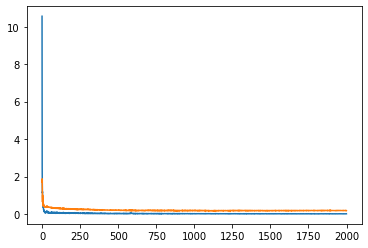

In [44]:
from matplotlib import pyplot

pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.show()

# We now get the RMSE for both train and test sets to see if they differ by much

# Make predictions based on train set and get a root mean squared error 

In [45]:
from sklearn.metrics import mean_squared_error
import math

train_yhat = tcn_aadt_norm.predict(train_X)
mse = mean_squared_error(train_y, train_yhat)
rmse = math.sqrt(mse)

In [46]:
print('Train RMSE: ' + str(rmse))

Train RMSE: 0.006697254159032821


# Make predictions based on test set and get a root mean squared error 

In [47]:
from sklearn.metrics import mean_squared_error
import math

test_yhat = tcn_aadt_norm.predict(test_X)
mse = mean_squared_error(test_y, test_yhat)
rmse = math.sqrt(mse)

In [48]:
print('Test RMSE: ' + str(rmse))

Test RMSE: 0.23368183347361995


# Plot train labels along with train predictions

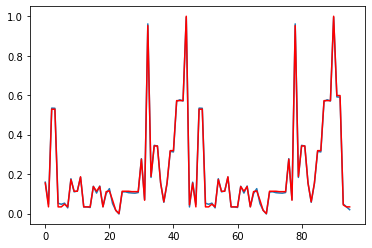

In [49]:
from matplotlib import pyplot

pyplot.plot(train_yhat, label='actual')
pyplot.plot(train_y, color='red', label='predicted')
pyplot.show()

# Plot test labels along with test predictions

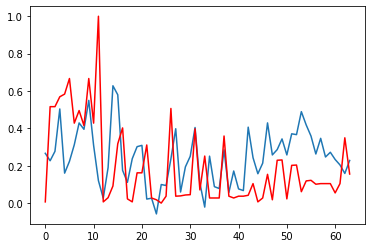

In [50]:
from matplotlib import pyplot

pyplot.plot(test_yhat, label='actual')
pyplot.plot(test_y, color='red', label='predicted')
pyplot.show()